# <font color = red> **`Eye for Blind`**

Deep learning solution for generating image captions with speech output to assist visually impaired individuals in understanding visual content.

- Github repo:- https://github.com/Saurabh4Dev/EyeForBlind
- Readme: https://github.com/Saurabh4Dev/EyeForBlind/blob/main/README.md
- Report: https://github.com/Saurabh4Dev/EyeForBlind/blob/main/EyeForBlind_SaurabhPandey_ProjectReport.pdf




## <font color = red> **Project Overview**

### <font color = red> **Problem Statement**

This project aims to assist visually impaired people by building a deep learning model that can describe images in speech. Using a CNN-RNN architecture with an attention mechanism, the model generates captions for images and converts them to audio using text-to-speech. The solution enables blind users to understand image content, similar to Facebook’s accessibility feature.

### <font color = red> **System Design**
- CNN-RNN Architecture with Attention
- Search Strategies (Greedy Search)
- Text-to-Speech Integration
- Comprehensive BLEU Score Evaluation
- Attention Visualization

This project aims to develop an AI system that describes images through speech, enabling visually impaired individuals to understand visual content.
Using the Flickr8k dataset, the model generates captions for images via a CNN and RNN architecture with an attention mechanism.

The CNN (Convolutional Neural Network) acts as an encoder, extracting key image features.

The RNN (Recurrent Neural Network) serves as a decoder, generating descriptive text (captions) word by word, guided by the attention layer to focus on relevant image regions.

The generated text is then converted to audio output using a text-to-speech (TTS) library.

The project integrates Deep Learning (Computer Vision + NLP) to build an assistive system that translates images into spoken descriptions.

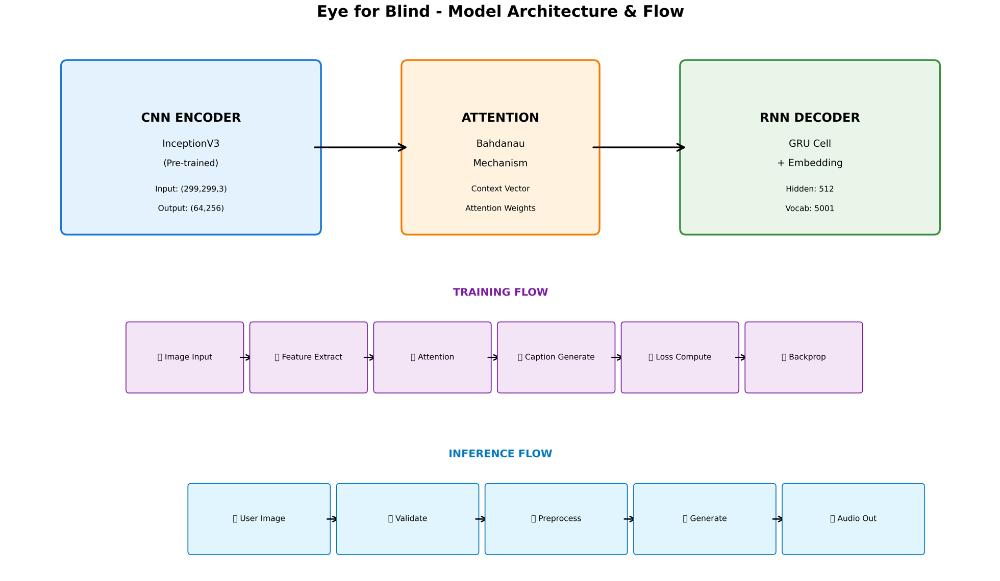

### <font color = red> **Implementation Summary**

This project implements an image captioning model with attention and text-to-speech output. The key steps are:

1.  **Data Preparation**:
    *   Flickr8k dataset images and captions are loaded.
    *   Captions are preprocessed: tokenized, filtered, and padded.
    *   Images are resized and preprocessed for the InceptionV3 model.
    *   Image features are extracted using a pre-trained InceptionV3 model to save memory and computational time.
    *   Image paths and captions are split into training and testing sets.
    *   A data pipeline using `tf.data.Dataset` is created to efficiently load image features and captions in batches.

2.  **Modelling Building**:
    *   An **Encoder** (CNN\_Custom\_Encoder) uses a fully connected layer to process the extracted image features.
    *   An **Attention** mechanism (BahdanauAttention) calculates the attention weights, allowing the model to focus on relevant parts of the image during caption generation. Different attention mechanisms (Luong, Dot-Product) were also defined.
    *   A **Decoder** (RNN\_Custom\_Decoder) uses a GRUCell and an Embedding layer to generate captions word by word, using the context vector from the attention mechanism and the previous word.

3.  **Training and Optimization**:
    *   The model is trained using the Adam optimizer and Sparse Categorical Crossentropy loss with masking for padded sequences.
    *   Teacher forcing is applied during training to guide the decoder with the true next word.
    * Training performed for defined number of epochs as it provided better results(predicted captions).
    * Early stopping is provided as choice for implementation to monitor test loss and prevent overfitting and saving the best model checkpoint but the Predicted captions are more near to ground truth without early stopping so it exists as choice but not used.
    *   Training progress and loss curves are visualized.

4.  **Model Evaluation and Prediction**:
    *   A greedy search function is defined to generate captions for new images.
    *   The BLEU score is used to evaluate the quality of the generated captions against the real captions, with different weightings for n-grams.
    *   A function is created to convert the generated captions into audio using gTTS.
    *   Attention maps are visualized to show which parts of the image the model is focusing on for each word in the generated caption.

## <font color = red> **Data Preparation**

### <font color = red> **Data and Libraries**

<font color = red> **Install**

In [1]:
# Install Google text to speech library
!pip install gTTS

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.2/98.2 kB 4.2 MB/s eta 0:00:00
  Attempting uninstall: click
    Found existing installation: click 8.3.0
    Uninstalling click-8.3.0:
      Successfully uninstalled click-8.3.0


<font color = red> **Import**

In [2]:
#Import all the required libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline
import cv2
import glob
import time
import tensorflow as tf
import keras
import nltk
import os
import warnings
import logging

In [3]:
from keras.applications.inception_v3 import preprocess_input
from keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.preprocessing.text import Tokenizer
from keras import Input, layers
from nltk.translate.bleu_score import sentence_bleu
from typing import Tuple, List, Dict, Optional
from IPython.display import Audio, display
from PIL import Image
from collections import Counter
from nltk.corpus import stopwords
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from tqdm import tqdm
from gtts import gTTS
from IPython.display import Audio
from google.colab import drive

In [4]:
nltk.download('stopwords')
# connect to google drive
drive.mount('/content/drive')
# Suppress warnings for cleaner output
warnings.filterwarnings('ignore')
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


Mounted at /content/drive


### <font color = red> **Data understanding**
1.Import the dataset and read image & captions into two seperate variables

2.Visualise both the images & text present in the dataset

3.Create a dataframe which summarizes the image, path & captions as a dataframe

4.Create a list which contains all the captions & path

5.Visualise the top 30 occuring words in the captions



In [5]:
# Path variables
images='/content/drive/MyDrive/Capstone_EyeForBlind/flickr8k_data/Images'
text_file = '/content/drive/MyDrive/Capstone_EyeForBlind/flickr8k_data/captions.txt'
audio_output_path = '/content/drive/MyDrive/Capstone_EyeForBlind/audio_outputs'

<font color = red> **Import the dataset and read the image**

In [6]:
# Verify image paths exist and display configuration
if os.path.exists(images):
    print("Images directory found")
    print(f"Images directory: {images}")
else:
    print("Images directory not found. Please update the path.")

Images directory found
Images directory: /content/drive/MyDrive/Capstone_EyeForBlind/flickr8k_data/Images


<font color = red> **Verify captions paths exist and display configuration**

In [7]:

if os.path.exists(text_file):
    print("Captions file found")
    print(f"Captions file: {text_file}")
else:
    print("Captions file not found. Please update the path.")

Captions file found
Captions file: /content/drive/MyDrive/Capstone_EyeForBlind/flickr8k_data/captions.txt


<font color = red> **Import the image dataset and read the image into a separate variable**

In [8]:
all_imgs = glob.glob(images + '/*.jpg', recursive=True)
print(f"Image directory being used: {images}")
print("The total images present in the dataset: {}".format(len(all_imgs)))

# Check if images exists
if len(all_imgs) == 0:
    print("No images found! Please check the images path.")
else:
    print(f"Successfully found {len(all_imgs)} images")

Image directory being used: /content/drive/MyDrive/Capstone_EyeForBlind/flickr8k_data/Images
The total images present in the dataset: 8091
Successfully found 8091 images


<font color = red> **Visualize both the images & text present in the dataset**

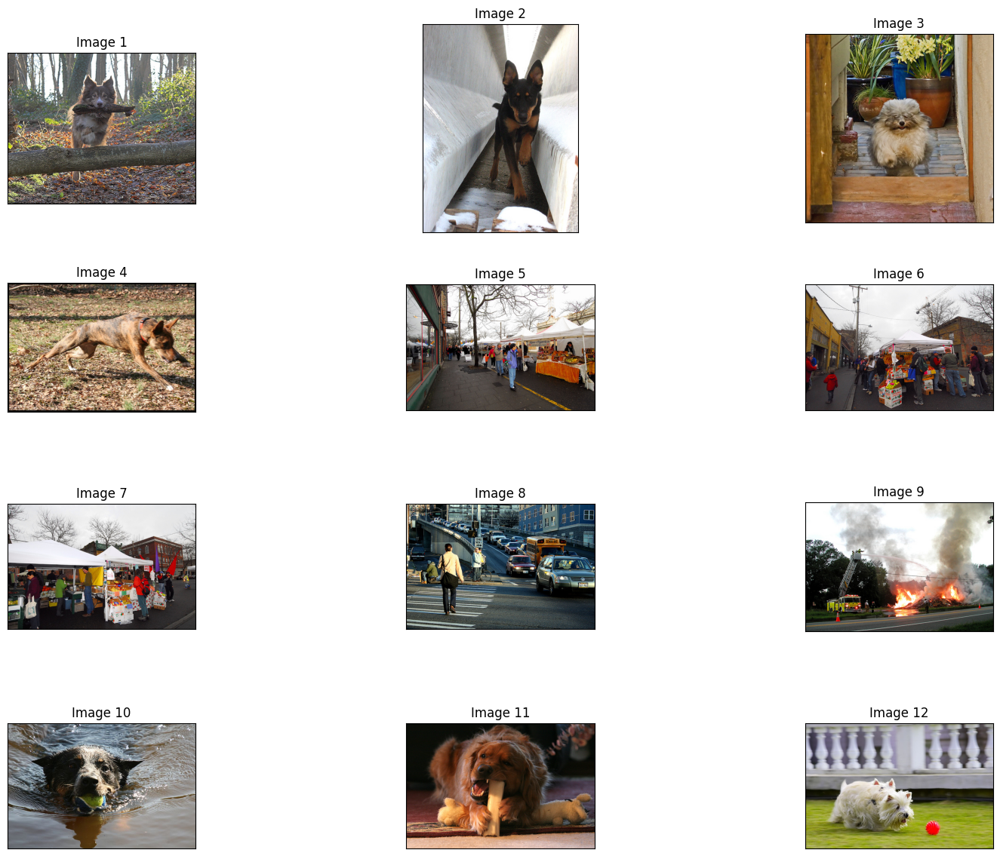

In [9]:
# Images
num_rows = 4
num_cols = 3
num_imgs = num_rows * num_cols
plt.figure(figsize=(16, 12))

for i in range(min(num_imgs, len(all_imgs))):
    plt.subplot(num_rows, 2*num_cols, 2*i+1)
    plt.xticks([])
    plt.yticks([])
    try:
        plt.imshow(mpimg.imread(all_imgs[i]))
        plt.title(f"Image {i+1}")
    except Exception as e:
        print(f"Error loading image {i+1}: {e}")

plt.tight_layout()
plt.show()

<font color = red> **Load captions dataframe**

In [10]:
try:
    image_captions_df = pd.read_csv(text_file)
    print("Captions loaded successfully")
    print(f"Dataframe shape: {image_captions_df.shape}")
    display(image_captions_df.head())
except Exception as e:
    print(f"Error loading captions: {e}")

Captions loaded successfully
Dataframe shape: (40455, 2)


,image,caption
0,1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set o...
1,1000268201_693b08cb0e.jpg,A girl going into a wooden building .
2,1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .
3,1000268201_693b08cb0e.jpg,A little girl climbing the stairs to her playh...
4,1000268201_693b08cb0e.jpg,A little girl in a pink dress going into a woo...


<font color = red> **Import the dataset and read the text file into a seperate variable**

In [11]:
def load_doc(filename):
    """
    Load and parse the captions file.

    Args:
        filename (str): Path to the captions file

    Returns:
        list: List of [image_name, caption] pairs
    """
    try:
        file = open(filename, 'r')
        text = list(filter(None, (line.rstrip() for line in file)))
        file.close()

        lst_line = []
        for line in text:
            lst_line.append(line.split(',', maxsplit=1))
        return lst_line
    except Exception as e:
        print(f"Error loading document: {e}")
        return []

# Using the provided path for the text file
print(f"Text file being used: {text_file}")
doc = load_doc(text_file)

if doc:
    print(f"Successfully loaded {len(doc)} caption entries")
    print("Sample entries:")
    for i, entry in enumerate(doc[:5]):
        print(f"   {i}: {entry}")
else:
    print("Failed to load captions")

# Contents presented is Image(JPG format) name and its captions in list format
# Showing only first few captions and images

Text file being used: /content/drive/MyDrive/Capstone_EyeForBlind/flickr8k_data/captions.txt
Successfully loaded 40456 caption entries
Sample entries:
   0: ['image', 'caption']
   1: ['1000268201_693b08cb0e.jpg', 'A child in a pink dress is climbing up a set of stairs in an entry way .']
   2: ['1000268201_693b08cb0e.jpg', 'A girl going into a wooden building .']
   3: ['1000268201_693b08cb0e.jpg', 'A little girl climbing into a wooden playhouse .']
   4: ['1000268201_693b08cb0e.jpg', 'A little girl climbing the stairs to her playhouse .']


Create a dataframe which summarizes the image, path & captions as a dataframe

Each image id has 5 captions associated with it therefore the total dataset should have 40455 samples.

In [12]:
# Create Pandas dataframe
if doc:
    all_img_id = [i[0] for i in doc[1:]]     # store all the image id here
    all_img_vector = ['/content/drive/MyDrive/Capstone_EyeForBlind/flickr8k_data/Images/'+ i[0] for i in doc[1:]] # store all the image path
    annotations = [i[1] for i in doc[1:]]  # store all the captions

    df = pd.DataFrame(list(zip(all_img_id, all_img_vector, annotations)), columns=['ID', 'Path', 'Captions'])

    print(f"Created dataframe with {len(df)} entries")
    print(f"\n Dataset Statistics:")
    print(f"1. Total image-caption pairs: {len(df)}")
    print(f"2. Unique images: {len(df['ID'].unique())}")
    print(f"3. Average caption length: {df['Captions'].str.len().mean():.1f} characters")
    print(df.info())
else:
    print("No caption data loaded")

# 40455 image and caption pairs loaded as for each Image 5 captions exists=> 8091*5 = 40455.
#  40456 caption entries from captions.txt loaded from which one is Header

Created dataframe with 40455 entries

 Dataset Statistics:
1. Total image-caption pairs: 40455
2. Unique images: 8091
3. Average caption length: 55.3 characters
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40455 entries, 0 to 40454
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   ID        40455 non-null  object
 1   Path      40455 non-null  object
 2   Captions  40455 non-null  object
dtypes: object(3)
memory usage: 948.3+ KB
None


<font color = red> **Visualize Image with captions**

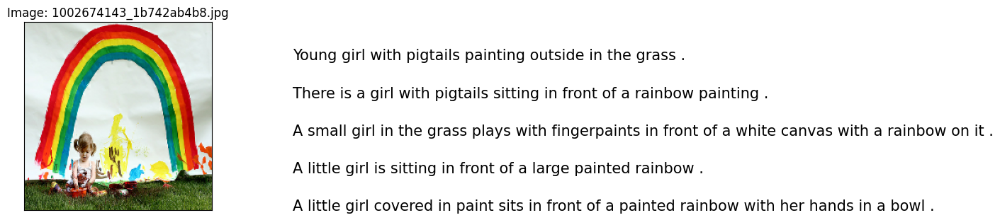

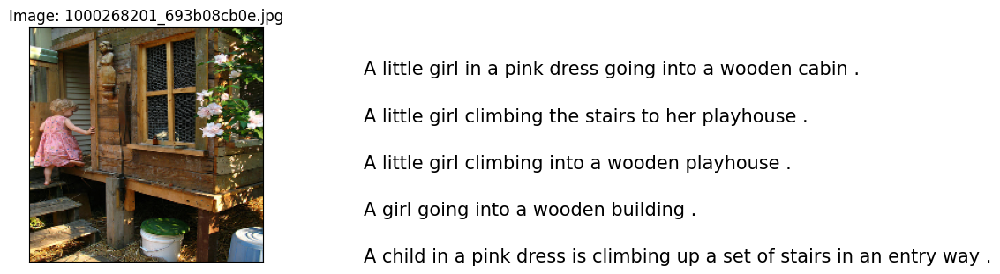

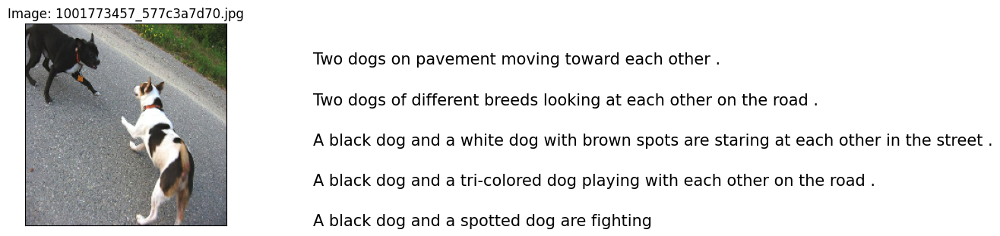

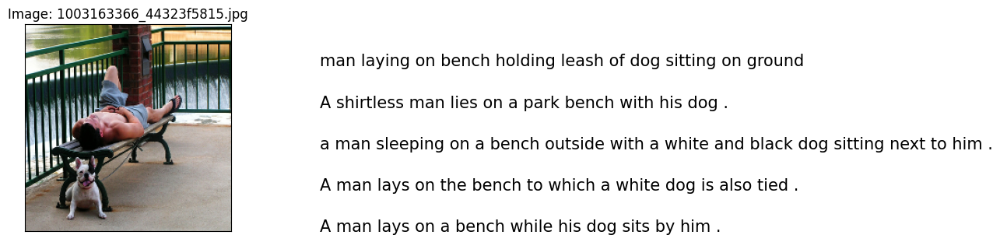

In [13]:
# Visualize some the images along with their captions

img_path=list(set(df.Path[:20]))   # each image has 5 captions. 20/5 = 4 images
count = 1
j=0
for path in img_path:
    img = tf.io.read_file(path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.convert_image_dtype(img, tf.float32)
    img = tf.image.resize(img, [224, 224])

    fig = plt.figure(figsize=(10,20))
    ax = fig.add_subplot(5,2,count,xticks=[],yticks=[])
    ax.imshow(img)
    ax.set_title(f"Image: {os.path.basename(path)}")

    count += 1

    ax = fig.add_subplot(5,2,count)
    plt.axis('off')
    ax.plot()
    ax.set_xlim(0,1)
    ax.set_ylim(0,5)

    img_cap=df.loc[df['Path'] == path, 'Captions']

    for i in range(len(img_cap)):
        ax.text(0,i,img_cap.iloc[i],fontsize=15)
    count += 1
    j+=1
plt.show()

In [14]:
if 'df' in locals():
    #Create a list which contains all the captions
    annotations= df['Captions'].tolist()#write your code here

    #add the <start> & <end> token to all those captions as well
    annotations = ["<start> " + caption + " <end>" for caption in annotations]


    #Create a list which contains all the path to the images
    all_img_path=df['Path'].tolist() #write your code here

    print("Total captions present in the dataset: "+ str(len(annotations)))
    print("Total images present in the dataset: " + str(len(all_img_path)))

else:
    print("Cannot create caption lists - no dataframe available")

Total captions present in the dataset: 40455
Total images present in the dataset: 40455



**Inference**
1. The total number of captions and images is 40455 is because of how the data is structured in the dataframe and lists created from it.
2. Each row in the dataframe represents a single image-caption pair.
3. Since there are 8091 images in the dataset and each image has 5 different captions,the total number of these pairs is 8091 * 5 = 40455

<font color = red> **Create vocabulary**

In [15]:
#Create the vocabulary & the counter for the captions

# vocabulary= #write your code here

# val_count=Counter(vocabulary)
# val_count

if 'df' in locals():
    vocabulary = []
    for sentence in df['Captions']:
        for word in sentence.lower().split():
            vocabulary.append(word)

    vocabulary_count = Counter(vocabulary)
    print(f"Vocabulary created with {len(vocabulary_count)} unique words")
    print(f"Total words in corpus: {len(vocabulary)}")

    # Show 10 common words
    print("\n Top 10 common words:")
    for word, count in vocabulary_count.most_common(10):
        print(f"   {word}: {count}")
else:
    print("Cannot create vocabulary - no dataframe available")

Vocabulary created with 9180 unique words
Total words in corpus: 476665

 Top 10 common words:
   a: 61752
   .: 34212
   in: 18965
   the: 18249
   on: 10732
   is: 9345
   and: 8851
   dog: 8126
   with: 7761
   man: 7238


<font color = red> **Visualise top words**

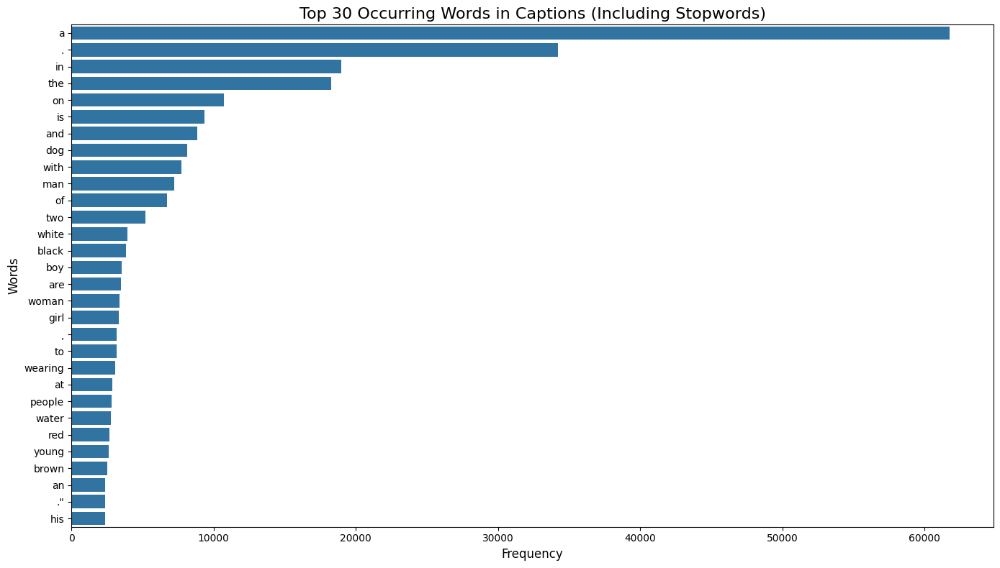

Displayed top 30 terms (including stopwords)


In [16]:
#Visualise the top 30 occuring words including stop words the captions
#write your code here
if 'vocabulary_count' in locals():
    sort_list = vocabulary_count.most_common(30)
    x, y = [], []

    for word, count in sort_list:
        # if word.lower() not in stop: # Removed stop word filtering
        x.append(word)
        y.append(count)

    plt.figure(figsize=(14, 8))
    sns.barplot(x=y[:30], y=x[:30])  # Show top 30
    plt.title('Top 30 Occurring Words in Captions (Including Stopwords)', fontsize=16)
    plt.xlabel('Frequency', fontsize=12)
    plt.ylabel('Words', fontsize=12)
    plt.tight_layout()
    plt.show()

    print(f"Displayed top {len(x[:30])} terms (including stopwords)")
else:
    print("Cannot visualize words as vocabulary is not available")

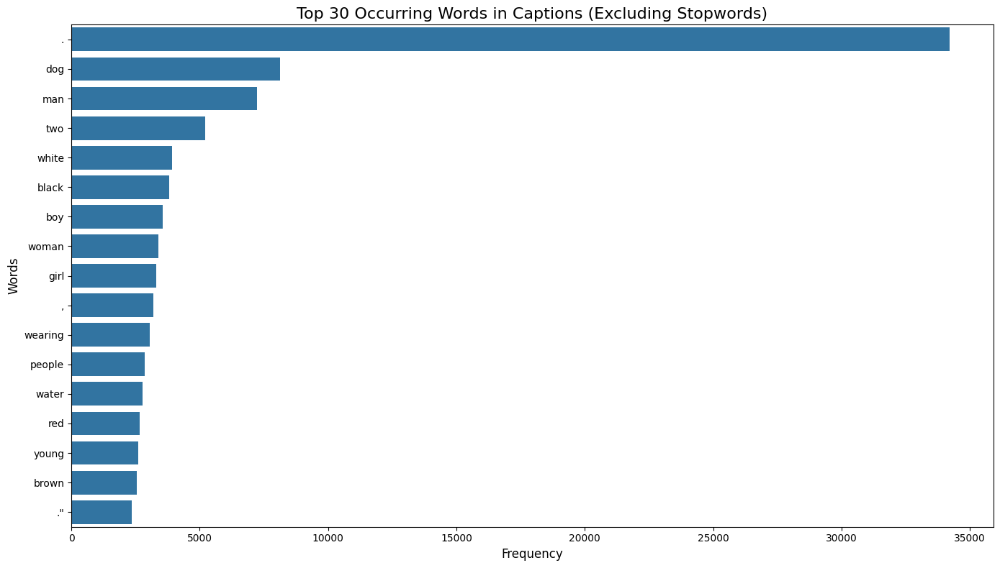

Displayed top 17 non-stopword terms


In [17]:
#Visualise the top 30 occuring words in the captions excluding stopwords
#write your code here
if 'vocabulary_count' in locals():
    sort_list = vocabulary_count.most_common(30)
    stop = set(stopwords.words('english'))
    x, y = [], []

    for word, count in sort_list:
        if word.lower() not in stop:
            x.append(word)
            y.append(count)

    plt.figure(figsize=(14, 8))
    sns.barplot(x=y[:30], y=x[:30])  # Show top 30
    plt.title('Top 30 Occurring Words in Captions (Excluding Stopwords)', fontsize=16)
    plt.xlabel('Frequency', fontsize=12)
    plt.ylabel('Words', fontsize=12)
    plt.tight_layout()
    plt.show()

    print(f"Displayed top {len(x[:30])} non-stopword terms")
else:
    print("Cannot visualize words as vocabulary is not available")

### <font color = red> **Pre-Processing the captions**
1.Create the tokenized vectors by tokenizing the captions fore ex :split them using spaces & other filters.
This gives us a vocabulary of all of the unique words in the data. Keep the total vocaublary to top 5,000 words for saving memory.

2.Replace all other words with the unknown token "UNK" .

3.Create word-to-index and index-to-word mappings.

4.Pad all sequences to be the same length as the longest one.

<font color = red>  **Create the tokenizer**

In [18]:

#your code here
if 'annotations' in locals():
    top_k = 5000
    tokenizer = tf.keras.preprocessing.text.Tokenizer(
        num_words=top_k,
        oov_token="<unk>",
        filters=r'!"#$%&()*+.-/:;=?@[\]^_`{|}~ '
    )
    tokenizer.fit_on_texts(annotations)

    print(f"Tokenizer created successfully")
    print(f"Vocabulary size: {len(tokenizer.word_index)}")
    print(f"Target vocabulary size: {top_k}")
else:
    print("Cannot create tokenizer as annotations are not available")

Tokenizer created successfully
Vocabulary size: 8497
Target vocabulary size: 5000


<font color = red> **Create word-to-index and index-to-word mappings.**

In [19]:
#
if 'tokenizer' in locals():
    #your code here
    word_index = tokenizer.word_index
    index_word = tokenizer.index_word

    train_seqs = tokenizer.texts_to_sequences(annotations)

    tokenizer.word_index['<pad>'] = 0
    tokenizer.index_word[0] = '<pad>'

    print(f"Word mappings created")
    print(f" Original form: {annotations[1]}")
    print(f" Tokenized form: {train_seqs[1]}")

    # Show some word mappings
    print(f"\n Sample word mappings:")
    sample_words = ['<start>', '<end>', '<unk>', '<pad>', 'dog', 'cat', 'man', 'woman']
    for word in sample_words:
        if word in word_index:
            idx = word_index[word]
            print(f"   '{word}' → {idx}")
else:
    print("Cannot create mappings as tokenizer is not available")

Word mappings created
 Original form: <start> A girl going into a wooden building . <end>
 Tokenized form: [3, 2, 20, 318, 66, 2, 198, 119, 4]

 Sample word mappings:
   '<start>' → 3
   '<end>' → 4
   '<unk>' → 1
   '<pad>' → 0
   'dog' → 10
   'cat' → 592
   'man' → 12
   'woman' → 19


 <font color = red> **Create a word count of your tokenizer to visulize**

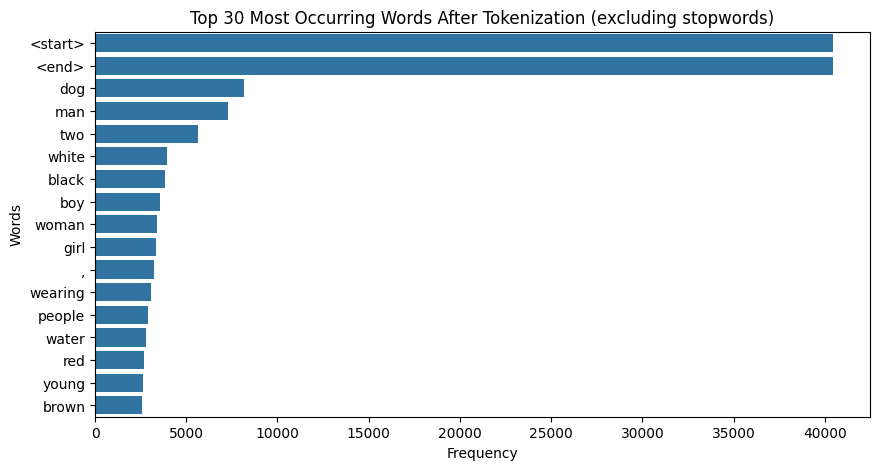

In [20]:
# Create a word count of your tokenizer to visulize the Top 30 occuring words after text processing

word_counts_tokenizer = tokenizer.word_counts

# Sort the word counts and get the top 30
sorted_word_counts = sorted(word_counts_tokenizer.items(), key=lambda item: item[1], reverse=True)
top_30_words_tokenizer = sorted_word_counts[:30]

# Separate words and counts
words_tokenizer = [word for word, count in top_30_words_tokenizer]
counts_tokenizer = [count for word, count in top_30_words_tokenizer]

# Filter out stop words
stop_words = set(stopwords.words('english'))
filtered_words = []
filtered_counts = []
for word, count in top_30_words_tokenizer:
    if word not in stop_words:
        filtered_words.append(word)
        filtered_counts.append(count)


plt.figure(figsize=(10, 5))
sns.barplot(x=filtered_counts, y=filtered_words)
plt.xticks(rotation=0)
plt.title('Top 30 Most Occurring Words After Tokenization (excluding stopwords)')
plt.xlabel('Frequency')
plt.ylabel('Words')
plt.show()

In [21]:
# Pad each vector to the max_length of the captions ^ store it to a vairable

if 'train_seqs' in locals():
    # Find the maximum length of a caption
    max_length = max([len(x) for x in train_seqs])
    print("Maxium length of a caption:\n", max_length)

    # pad captions in the train seqs to reach max length with 0's
    cap_vector = keras.preprocessing.sequence.pad_sequences(train_seqs, padding='post', maxlen=max_length)

    print("The shape of Caption vector is :" + str(cap_vector.shape))
    print("Sample Padded sequences:\n", cap_vector[1])
    print(f"\n Padding statistics:")
    print(f"1. Original sequence lengths: min={min([len(x) for x in train_seqs])}, max={max([len(x) for x in train_seqs])}")
    print(f"2. After padding: all sequences have length {max_length}")
    print(f"3. Total sequences: {len(cap_vector)}")
else:
    print("Cannot pad sequences as tokenized sequences are not available")

Maxium length of a caption:
 40
The shape of Caption vector is :(40455, 40)
Sample Padded sequences:
 [  3   2  20 318  66   2 198 119   4   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0]

 Padding statistics:
1. Original sequence lengths: min=3, max=40
2. After padding: all sequences have length 40
3. Total sequences: 40455


### <font color = red> **Pre-processing the images**

1.Resize them into the shape of (299, 299)

2.Normalize the image within the range of -1 to 1, such that it is in correct format for InceptionV3.

<font color = red> **Resize the images**
* Since you have a list which contains all the image path, you need to first convert them to a dataset using <i>tf.data.Dataset.from_tensor_slices</i>. Once you have created a dataset consisting of image paths, you need to apply a function to the dataset which will apply the necessary preprocessing to each image.
* This function should resize them and also should do the necessary preprocessing that it is in correct format for InceptionV3.


In [22]:
#write your code here to create the dataset consisting of image paths
image_path_dataset = tf.data.Dataset.from_tensor_slices(all_img_path)

In [23]:
# Preprocess images
def load_image(image_path):
    """
    Load and preprocess image for InceptionV3.
    Args: image_path (str): Path to the image file
    Returns: tuple: Preprocessed image and image path
    """
    # Read and decode image
    img = tf.io.read_file(image_path)
    img = tf.image.decode_jpeg(img, channels=3)

    # Resize to InceptionV3 input size (299, 299)
    img = tf.image.resize(img, (299, 299))

    # Preprocess for InceptionV3 (normalize to [-1, 1] range)
    img = preprocess_input(img)

    return img, image_path

print("Function processes images to (299, 299) and normalizes for InceptionV3")

Function processes images to (299, 299) and normalizes for InceptionV3


In [24]:
#write your code here for applying the function to the image path dataset, such that the transformed dataset should contain images & their path

if 'image_path_dataset' in locals():
    print("Applying preprocessing to image dataset...")

    image_dataset = image_path_dataset.map(
        load_image,
        num_parallel_calls=tf.data.experimental.AUTOTUNE
    )

    print(f"Image preprocessing applied successfully")
    print(f"Processed image dataset: {image_dataset}")

    # Test the preprocessing on a sample
    try:
        sample_img, sample_path = next(iter(image_dataset))
        print(f"1. Image shape: {sample_img.shape}")
        print(f"2. Image range: [{sample_img.numpy().min():.2f}, {sample_img.numpy().max():.2f}]")
        print(f"3. Sample path: {sample_path.numpy().decode('utf-8')[-30:]}...")  # Show last 30 chars
    except Exception as e:
        print(f"Error testing preprocessing: {e}")
else:
    print("image_path_dataset is not available")

Applying preprocessing to image dataset...
Image preprocessing applied successfully
Processed image dataset: <_ParallelMapDataset element_spec=(TensorSpec(shape=(299, 299, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.string, name=None))>
1. Image shape: (299, 299, 3)
2. Image range: [-1.00, 1.00]
3. Sample path: ages/1000268201_693b08cb0e.jpg...


## <font color = red> **Modelling Building**


**Architecture**


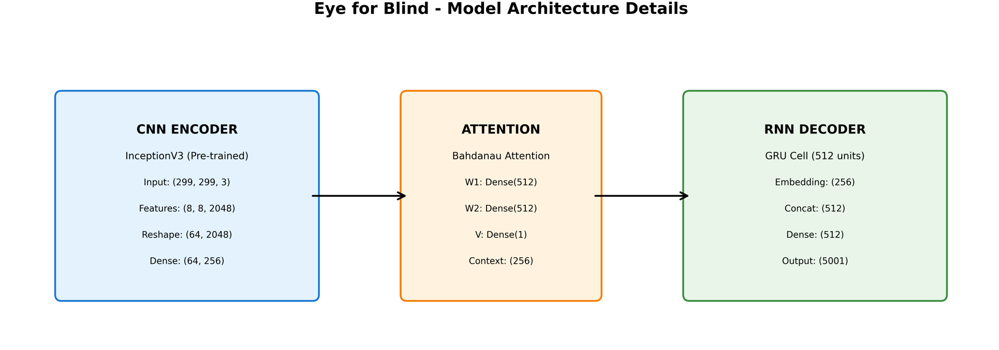

### <font color = red> **Load the pretrained Imagenet weights of Inception net V3**

1.To save the memory(RAM) from getting exhausted, extract the features of the images using the last layer of pre-trained model. Including this as part of training will lead to higher computational time.

2.The shape of the output of this layer is 8x8x2048.

3.Use a function to extract the features of each image in the train & test dataset such that the shape of each image should be (batch_size, 8*8, 2048)



In [25]:
# initialize model and load pretrained weights
image_model = tf.keras.applications.InceptionV3(include_top=False,weights='imagenet')
new_input = image_model.input
hidden_layer = image_model.layers[-1].output

#model
base_model = keras.Model(new_input, hidden_layer)
print(f"InceptionV3 loaded")
base_model.summary()

87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
InceptionV3 loaded


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, None,      │          0 │ -                 │
│ (InputLayer)        │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, None,      │        864 │ input_layer[0][0] │
│                     │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, None,      │         96 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, None,      │          0 │ batch_normalizat… │
│ (Activation)        │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, None,      │      9,216 │ activation[0][0]  │
│                     │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, None,      │         96 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, None,      │          0 │ batch_normalizat… │
│ (Activation)        │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, None,      │     18,432 │ activation_1[0][… │
│                     │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, None,      │        192 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, None,      │          0 │ batch_normalizat… │
│ (Activation)        │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, None,      │          0 │ activation_2[0][… │
│ (MaxPooling2D)      │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, None,      │      5,120 │ max_pooling2d[0]… │
│                     │ None, 80)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, None,      │        240 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ None, 80)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, None,      │          0 │ batch_normalizat… │
│ (Activation)        │ None, 80)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, None,      │    138,240 │ activation_3[0][… │
│                     │ None, 192)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, None,      │        576 │ conv2d_4[0][0]    │
│ (BatchNormalizatio… │ None, 192)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_4        │ (None, None,      │          0 │ batch_normalizat

 Total params: 21,802,784 (83.17 MB)

 Trainable params: 21,768,352 (83.04 MB)

 Non-trainable params: 34,432 (134.50 KB)

**Load the features:**
* You can load the features using the dictionary created earlier OR
* You can store using numpy(np.load) to load the feature vector.

**Store the features:**
* You can store the features using a dictionary with the path as the key and values as the feature extracted by the inception net v3 model OR
* You can store using numpy(np.save) to store the resulting vector.

In [26]:
# write the code to apply the feature_extraction model to your earlier created dataset which contained images & their respective paths
# Once the features are created, you need to reshape them such that feature shape is in order of (batch_size, 8*8, 2048)

# Save npy once and use multiple time
# Create a dictionary to store image features
image_features = {}
feature_file = '/content/drive/MyDrive/Capstone_EyeForBlind/flickr8k_data/image_features.npy'

# Check if features already exist
import os
if os.path.exists(feature_file):
    image_features = np.load(feature_file, allow_pickle=True).item() #cached
    print("Loaded existing image features.")
else:
    # Iterate over the image dataset and extract features
    for img, path in tqdm(image_dataset):
        # Add a batch dimension to the image tensor
        img = tf.expand_dims(img, axis=0)
        # Extract features using the base model
        batch_features = base_model(img)
        # Reshape the features
        batch_features = tf.reshape(batch_features,(batch_features.shape[0], -1, batch_features.shape[3]))
        # Store the features in the dictionary with the image path as the key
        image_features[path.numpy().decode('utf-8')] = batch_features.numpy()

    # Save the extracted features
    np.save(feature_file, image_features)
    print("Image feature extraction complete and saved.")

Loaded existing image features.


### <font color = red> **Dataset creation**
1.Apply train_test_split on both image path & captions to create the train & test list. Create the train-test spliit using 80-20 ratio & random state = 42

2.Create a function which maps the image path to their feature.

3.Create a builder function to create train & test dataset & apply the function created earlier to transform the dataset

2.Make sure you have done Shuffle and batch while building the dataset

3.The shape of each image in the dataset after building should be (batch_size, 8*8, 2048)

4.The shape of each caption in the dataset after building should be(batch_size, max_len)


In [27]:
# Shuffle captions and image_names together
all_img_path, cap_vector = shuffle(all_img_path, cap_vector, random_state=42)

# Create training and validation sets using an 80-20 split
path_train, path_test, cap_train, cap_test = train_test_split(all_img_path, cap_vector, random_state=42)

In [28]:
print("Training data for images: " + str(len(path_train)))
print("Testing data for images: " + str(len(path_test)))
print("Training data for Captions: " + str(len(cap_train)))
print("Testing data for Captions: " + str(len(cap_test)))

Training data for images: 30341
Testing data for images: 10114
Training data for Captions: 30341
Testing data for Captions: 10114


<font color = red> **Maps the image path to their feature**

In [29]:
# Create a function which maps the image path to their feature.
# This function will take the image_path & caption and return it's feature & respective caption.

# Set Batch and Buffer Size
BATCH_SIZE = 64
BUFFER_SIZE = 2000

# To load image features

def map_func(img_name, cap):
    # Decode the image name (path) from bytes to string
    # img_path_str = img_name.decode('utf-8') # Removed decoding
    # Handle both tensor and numpy array input for robustness
    if isinstance(img_name, tf.Tensor):
        img_path_str = img_name.numpy().decode('utf-8')
    elif isinstance(img_name, np.ndarray):
        img_path_str = img_name.decode('utf-8')
    else:
        img_path_str = img_name # Assume it's already a string if not a tensor or numpy array

    # Look up the feature tensor in the loaded dictionary
    img_tensor = image_features[img_path_str].squeeze() # Remove the extra dimension here
    return img_tensor, cap

def tf_map_func(img_name, cap):
    # Ensure img_name is a TensorFlow string tensor before passing to py_function
    img_name_tf = tf.convert_to_tensor(img_name, dtype=tf.string)
    # Pass img_name as bytes to map_func
    img_tensor, cap = tf.py_function(map_func, [img_name_tf, cap], [tf.float32, tf.int32])
    img_tensor.set_shape([64, 2048])
    cap.set_shape([max_length])
    return img_tensor, cap


In [30]:
# create a builder function to create dataset which takes in the image path & captions as input
# This function should transform the created dataset(img_path,cap) to (features,cap) using the map_func created earlier

def gen_dataset(img_data, cap_data):
    dataset = tf.data.Dataset.from_tensor_slices((img_data, cap_data))
    dataset = dataset.shuffle(BUFFER_SIZE)

    # Use the proper tf_map_func (with shape setting)
    dataset = dataset.map(tf_map_func, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.batch(BATCH_SIZE)
    dataset = dataset.prefetch(buffer_size=tf.data.AUTOTUNE)

    return dataset

In [31]:
train_dataset=gen_dataset(path_train,cap_train)
test_dataset=gen_dataset(path_test,cap_test)

In [32]:
sample_img_batch, sample_cap_batch = next(iter(train_dataset))
print(sample_img_batch.shape)  #(batch_size, 8*8, 2048)
print(sample_cap_batch.shape) #(batch_size,max_len)

(64, 64, 2048)
(64, 40)


### <font color = red> **Model Building**
1.Set the parameters

2.Build the Encoder, Attention model & Decoder

In [33]:
#Set the parameters - Hyperparameters

embedding_dim = 256
units = 512
vocab_size = top_k + 1 #top 5,000 words +1
train_num_steps = len(path_train) // BATCH_SIZE
test_num_steps = len(path_test) // BATCH_SIZE

###  <font color = red>  **Encoder**

In [34]:
class CNN_Custom_Encoder(keras.Model):
    # to pass extracted features through FC layer
    def __init__(self, embedding_dim):
        super(CNN_Custom_Encoder, self).__init__()
        self.fc = layers.Dense(embedding_dim)

    def call(self, x):
        x = self.fc(x)
        x = tf.nn.relu(x)
        return x

###  <font color = red>  **Attention model**

Attention types
- Bahdanau (Additive - tanh(W1 * h + W2 * s) - More parameters, can model complex relationships

- Luong (Multiplicative - h^T * W * s) - Fewer parameters, computationally efficient

- Dot-Produc(th^T * s) - Simplest, fastest, but limited expressiveness


In [35]:
# Attention mechanism
class BahdanauAttention(tf.keras.Model):
    def __init__(self, units):
        super(BahdanauAttention, self).__init__()
        self.W1 = tf.keras.layers.Dense(units) # This layer will be applied to the image features.
        self.W2 = tf.keras.layers.Dense(units) # This layer will be applied to the hidden state of the decoder.
        self.V = tf.keras.layers.Dense(1) # This layer will be used to calculate the attention scores.

    def call(self, features, hidden):
        hidden_with_time_axis = tf.expand_dims(hidden, 1)  # To expand the hidden shape to shape: (batch_size, 1, hidden_size)
        attention_hidden_layer = tf.nn.tanh(self.W1(features) + self.W2(hidden_with_time_axis))
        score = self.V(attention_hidden_layer) # build score funciton to shape: (batch_size, 8*8, units)
        attention_weights = tf.nn.softmax(score, axis=1) # to extract attention weights with shape: (batch_size, 8*8, 1)
        context_vector = attention_weights * features  #create the context vector with shape (batch_size, 8*8,embedding_dim)
        context_vector = tf.reduce_sum(context_vector, axis=1) # reduce the shape to (batch_size, embedding_dim)
        return context_vector, attention_weights

print("BahdanauAttention mechanism defined")

BahdanauAttention mechanism defined


In [36]:
class DotProductAttention(tf.keras.Model):
    """Dot-product attention for fast inference"""
    def __init__(self, units):
        super(DotProductAttention, self).__init__()
        self.units = units
        # No dense layers needed - just scaling!
        self.scale = tf.math.sqrt(tf.cast(units, tf.float32))

    def call(self, features, hidden):
        # features: (batch_size, 64, embedding_dim)
        # hidden: (batch_size, hidden_size)

        # Simple dot product
        scores = tf.matmul(features, tf.expand_dims(hidden, -1))  # (batch_size, 64, 1)
        scores = scores / self.scale  # Scale for stability

        attention_weights = tf.nn.softmax(scores, axis=1)
        context_vector = tf.reduce_sum(attention_weights * features, axis=1)

        return context_vector, attention_weights

print("Dot-product mechanism defined")

Dot-product mechanism defined


In [37]:
class LuongAttention(tf.keras.Model):
    """
    Luong (Multiplicative) Attention Mechanism
    - Faster than Bahdanau (fewer parameters)
    - Better than Dot-Product (more expressive)
    - Good balance of speed and performance
    """
    def __init__(self, units):
        super(LuongAttention, self).__init__()
        self.units = units
        # Single transformation matrix (fewer parameters than Bahdanau)
        self.W = tf.keras.layers.Dense(units, use_bias=False)

    def call(self, features, hidden):
        # features: (batch_size, 64, embedding_dim)
        # hidden: (batch_size, hidden_size)

        # Transform hidden state to match feature dimension
        # hidden_transformed: (batch_size, embedding_dim)
        hidden_transformed = self.W(hidden)

        # Expand for broadcasting: (batch_size, 1, embedding_dim)
        hidden_expanded = tf.expand_dims(hidden_transformed, 1)

        # Compute attention scores using element-wise multiplication
        # scores: (batch_size, 64, embedding_dim)
        scores = features * hidden_expanded

        # Sum across embedding dimension to get final scores
        # attention_scores: (batch_size, 64, 1)
        attention_scores = tf.reduce_sum(scores, axis=2, keepdims=True)

        # Apply softmax to get attention weights
        attention_weights = tf.nn.softmax(attention_scores, axis=1)

        # Compute context vector
        # context_vector: (batch_size, embedding_dim)
        context_vector = tf.reduce_sum(attention_weights * features, axis=1)

        return context_vector, attention_weights

print("Luong Attention mechanism defined")

Luong Attention mechanism defined


###  <font color = red> **Decoder**

In [38]:
attention_type = 'bahdanau'

**Problem with Standard GRU Layer**

**Problem**: Standard GRU layers fail in @tf.function training loops because their internal iteration over timesteps creates symbolic tensors that can't be compiled into TensorFlow's static computation graph (OperatorNotAllowedInGraphError).

**Solution**: Use GRUCell with manual timestep iteration for explicit control and graph compatibility; disable mask_zero=False in embeddings to avoid dynamic masking patterns that conflict with static graph compilation.

**GRU implementation with mask enabled**

- not used due to Error: OperatorNotAllowedInGraphError: Iterating over a symbolic tf.Tensor is not allowed

In [ ]:
# # Change and pass different attention_type to this decoder to try different attention types

# class RNN_Custom_Decoder(keras.Model):
#     def __init__(self, embed_dim, units, vocab_size, attention_type='bahdanau'):
#         super().__init__()
#         self.units=units
#         #iniitalise Attention model with units

#         # Choose attention based on type
#         if attention_type == 'luong':
#             self.attention = LuongAttention(self.units)
#         elif attention_type == 'dot_product':
#             self.attention = DotProductAttention(self.units)
#         else:
#             self.attention = BahdanauAttention(self.units)
#         #build Embedding layer
#         self.embed = layers.Embedding(vocab_size, embed_dim,mask_zero=True)
#         # self.units: The number of units in the GRU.
#         # return_sequences=True: GRU will return the output for each time step in the sequence.
#         # return_state=True: GRU will return the final hidden state after processing the sequence.
#         # recurrent_initializer='glorot_uniform': Sets the initializer for the recurrent kernel weights.
#         self.gru = layers.GRU(self.units,return_sequences=True,return_state=True,recurrent_initializer='glorot_uniform')
#         self.fc1 = layers.Dense(self.units)
#         self.fc2 = layers.Dense(vocab_size)
#         #self.dropout = Dropout(0.5)

#     def call(self, x, features, hidden, training=False):
#         context_vector, attention_weights = self.attention(features, hidden)
#         x = self.embed(x)
#         x = tf.concat([tf.expand_dims(context_vector, 1), x], axis = -1)

#         # The GRU layer returns a tuple when return_sequences=True and return_state=True
#         # The tuple contains (output, state)
#         # gru_outputs = self.gru(x, initial_state=hidden, training = training) # Pass hidden state explicitly

#         # if isinstance(gru_outputs, (list, tuple)) and len(gru_outputs) >= 2:
#         #     gru_output, state = gru_outputs[0], gru_outputs[1]
#         # else:
#         #     gru_output = gru_outputs if not isinstance(gru_outputs, (list, tuple)) else gru_outputs[0]
#         #     state = hidden
#         gru_outputs = self.gru(x, initial_state=hidden, training=training)
#         gru_output = gru_outputs[0]  # (batch, seq, units)
#         raw_state = gru_outputs[1]
#         batch_size = tf.shape(gru_output)[0]
#         if len(raw_state.shape) == 1:
#             # Expand and tile to match batch size
#             state = tf.expand_dims(raw_state, 0)  # (1, units)
#             state = tf.tile(state, [batch_size, 1])  # (batch, units)
#         else:
#             state = raw_state

#         x = self.fc1(gru_output)
#         x = tf.reshape(x, (-1, x.shape[2]))
#         x = self.fc2(x)          # logits
#         return x, state , attention_weights

#     # initialize the hidden state of the GRU with zeros at the beginning of the caption generation process
#     # for a batch of a given size.
#     def init_state(self, batch_size):
#         return tf.zeros((batch_size, self.units))

**GRUCell with mask disabled**

Decoder using GRUCell, which is a low-level GRU implementation that processes single timesteps. This approach provides explicit control over the recurrent computation and ensures graph-mode compatibility, while maintaining the same GRU mathematical operations as the high-level GRU layer.

Model is running into problems(shape mismatches, symbolic graph errors, or gradient flow issues) so switching to GRUCell as a stable fallback mechanism.

In [39]:
# GRUCell with mask zero
class RNN_Custom_Decoder(keras.Model):
    def __init__(self, embed_dim, units, vocab_size):
        super().__init__()
        self.units = units
        self.attention = BahdanauAttention(self.units)

        # Choose attention based on type
        if attention_type == 'luong':
            self.attention = LuongAttention(self.units)
        elif attention_type == 'dot_product':
            self.attention = DotProductAttention(self.units)
        else:
            self.attention = BahdanauAttention(self.units)

        self.embed = layers.Embedding(vocab_size, embed_dim, mask_zero=False)

        self.gru_cell = layers.GRUCell(self.units, recurrent_initializer='glorot_uniform')

        self.fc1 = layers.Dense(self.units)
        self.fc2 = layers.Dense(vocab_size)

    def call(self, x, features, hidden, training=False):
        context_vector, attention_weights = self.attention(features, hidden)
        x = self.embed(x)
        x = tf.concat([tf.expand_dims(context_vector, 1), x], axis=-1)

        # Manual GRU processing - for graph compatibility
        # x shape: (batch, 1, input_dim) - we process the single timestep
        gru_input = x[:, 0, :]  # Take the single timestep: (batch, input_dim)

        # Process through GRU cell
        gru_output, new_hidden = self.gru_cell(gru_input, hidden, training=training)

        # Reshape output to match expected format
        gru_output = tf.expand_dims(gru_output, 1)  # (batch, 1, units)

        x = self.fc1(gru_output)
        x = tf.reshape(x, (-1, x.shape[2]))
        x = self.fc2(x)

        return x, new_hidden, attention_weights

    def init_state(self, batch_size):
        return tf.zeros((batch_size, self.units))

### <font color = red> **Model training & optimization**
1.Set the optimizer & loss object

2.Create your checkpoint path

3.Create your training & testing step functions

4.Create your loss function for the test dataset


**Flow Diagram**
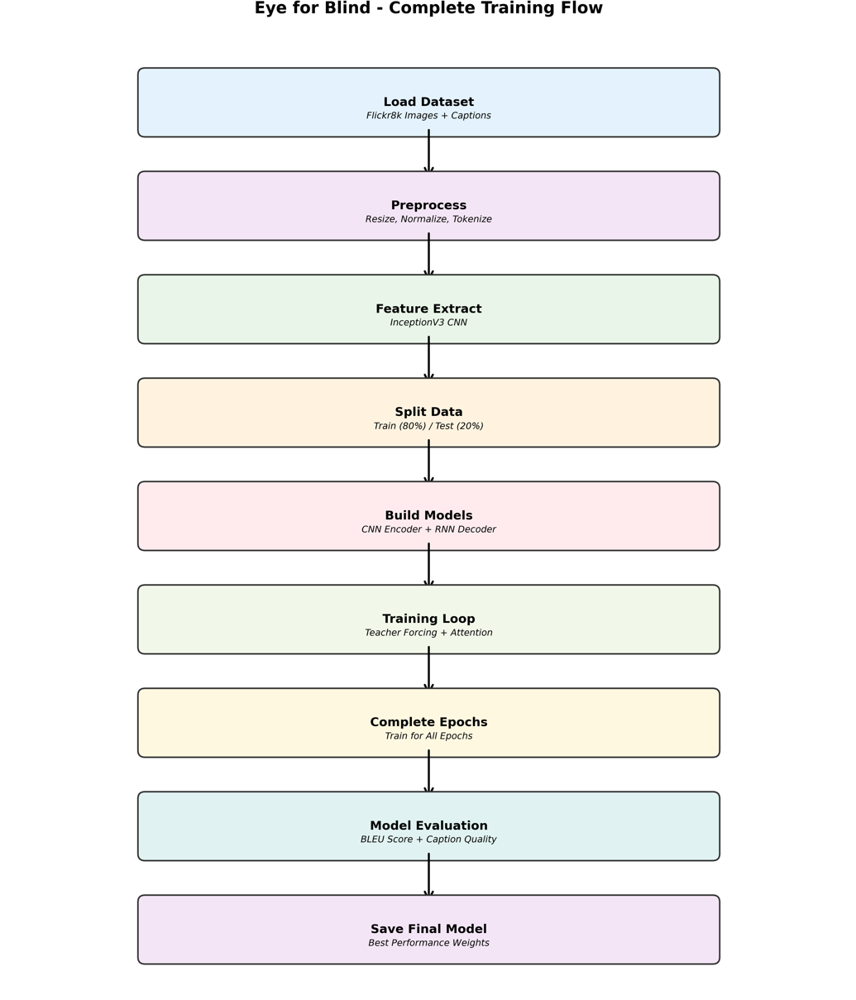

In [40]:
try:
    encoder=CNN_Custom_Encoder(embedding_dim)
    decoder=RNN_Custom_Decoder(embedding_dim, units, vocab_size)
    # Set Optmizer and Loss Object
    optimizer = tf.keras.optimizers.Adam()
    loss_object = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True, reduction='none')

    def loss_function(real, pred):
        mask = tf.math.logical_not(tf.math.equal(real, 0))
        loss_ = loss_object(real, pred)
        mask = tf.cast(mask, dtype=loss_.dtype)
        loss_ *= mask
        return tf.reduce_mean(loss_)

    print("Models Architecture: CNN Encoder + RNN Decoder + Attention initialized successfully")
except Exception as e:
    print(f"Model initialization failed: {e}")

Models Architecture: CNN Encoder + RNN Decoder + Attention initialized successfully


In [41]:
verify_model_shapes = True

if verify_model_shapes:
    features=encoder(sample_img_batch)

    hidden = decoder.init_state(batch_size=sample_cap_batch.shape[0])
    dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * sample_cap_batch.shape[0], 1)

    predictions,hidden_out, attention_weights= decoder(dec_input, features, hidden)
    # predictions, hidden_out, attention_weights = decoder(dec_input, features, hidden, training=False)
    print('Feature shape from Encoder: {}'.format(features.shape)) #(batch, 8*8, embed_dim)
    print('Predcitions shape from Decoder: {}'.format(predictions.shape)) #(batch,vocab_size)
    print('Attention weights shape from Decoder: {}'.format(attention_weights.shape)) #(batch, 8*8, embed_dim)

Feature shape from Encoder: (64, 64, 256)
Predcitions shape from Decoder: (64, 5001)
Attention weights shape from Decoder: (64, 64, 1)


In [42]:
checkpoint_path = "/content/drive/MyDrive/Capstone_EyeForBlind/checkpoints/train"
os.makedirs(checkpoint_path, exist_ok=True)   # ensure folder exists
ckpt = tf.train.Checkpoint(encoder=encoder,
                           decoder=decoder,
                           optimizer = optimizer)
ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)

In [43]:
start_epoch = 0
if ckpt_manager.latest_checkpoint:
    try:
        ckpt.restore(ckpt_manager.latest_checkpoint).expect_partial()
        start_epoch = int(ckpt_manager.latest_checkpoint.split('-')[-1])
        print(f"Restored checkpoint from epoch {start_epoch}")
        print(f"Checkpoint path: {ckpt_manager.latest_checkpoint}")
    except Exception as e:
        print(f"Failed to restore checkpoint: {e}")
        print("Starting training from scratch")
        start_epoch = 0
else:
    print("No existing checkpoint found - start fresh training")


# the model weights + optimizer states are restored, and
# loop starts from the correct epoch number.

No existing checkpoint found - start fresh training


* While creating the training step for your model, you will apply Teacher forcing.
* Teacher forcing is a technique where the target/real word is passed as the next input to the decoder instead of previous prediciton.

In [44]:
# train function - teacher forcing
@tf.function
def train_step(img_tensor, target):
    loss = 0.0
    batch_size = tf.shape(target)[0]
    hidden = decoder.init_state(batch_size=batch_size)
    dec_input = tf.expand_dims(tf.repeat(tokenizer.word_index['<start>'], batch_size), 1)

    with tf.GradientTape() as tape:
        # write your code here to do the training steps
        features = encoder(img_tensor, training=True)
        seq_len = tf.shape(target)[1]             # <- dynamic length
        for t in tf.range(1, seq_len):            # <- tf.range, not Python range
            logits, hidden, _ = decoder(dec_input, features, hidden, training=True)
            loss += loss_function(target[:, t], logits)
            dec_input = tf.expand_dims(target[:, t], 1)  # teacher forcing

    avg_loss = loss / tf.cast(seq_len, tf.float32)
    vars_ = encoder.trainable_variables + decoder.trainable_variables
    grads = tape.gradient(loss, vars_)
    optimizer.apply_gradients(zip(grads, vars_))
    return loss, avg_loss

* While creating the test step for your model, you will pass your previous prediciton as the next input to the decoder.

In [45]:
# test function - without teacher forcing
@tf.function
def test_step(img_tensor, target):
    loss = 0.0
    batch_size = tf.shape(target)[0]
    hidden = decoder.init_state(batch_size=batch_size)
    dec_input = tf.expand_dims(tf.repeat(tokenizer.word_index['<start>'], batch_size), 1)

    features = encoder(img_tensor, training=False)

    seq_len = tf.shape(target)[1]
    for t in tf.range(1, seq_len):
        logits, hidden, _ = decoder(dec_input, features, hidden, training=False)
        loss += loss_function(target[:, t], logits)
        # greedy step
        next_id = tf.argmax(logits, axis=1, output_type=tf.int32)
        dec_input = tf.expand_dims(next_id, 1)

    avg_loss = loss / tf.cast(seq_len, tf.float32)
    return loss, avg_loss

In [46]:
# test loss function
def test_loss_cal(test_dataset):
    total_loss_test = 0

    #write your code to get the average loss result on your test data
    for (batch, (img_tensor, target)) in enumerate(test_dataset):
        batch_loss, t_loss = test_step(img_tensor, target)
        total_loss_test += t_loss
        avg_test_loss=total_loss_test / test_num_steps

    return avg_test_loss

In [47]:
# Training parameters
EPOCHS = 15
loss_plot = []
test_loss_plot = []

**NOTE:**
* Since there is a difference between the train & test steps ( Presence of teacher forcing), you may observe that the train loss is decreasing while your test loss is not.
* This doesn't mean that the model is overfitting, as we can't compare the train & test results here, as both approach is different.
* Also, if you want to achieve better results you can run it more epochs, but the intent of this capstone is to give you an idea on how to integrate attention mechanism with E-D architecture for images. The intent is not to create the state of art model.

**Inference:-**

As per the Guidance received from starter notebook(quoted in above cell), the train loss decreased but test loss increased.

This gives an impression of Overfitting but can be expected as Train and Test approaches are different(one using teacher forcing during trainiing while not at time of testing).

Training done for all Epochs after Human evaluation for predicted vs. actual captions.

Common Techniques to avoid overfitting not used for current implementation.
- Early Stopping
- or Add Regularization
- or Reduce Learning Rate.


**Rationale for Training Completion(all Epochs) vs. Early Stopping:**

The decision to train for all epochs rather than implementing early stopping was based on comprehensive evaluation:

- **Caption Quality Assessment**: Generated captions demonstrated significantly higher semantic similarity to ground truth when trained for complete epochs
- **Human Evaluation**: Manual review of predicted vs. real captions revealed that extended training produced more contextually accurate and meaningful descriptions
- **Semantic Coherence**: While predicted captions were not identical to ground truth, they captured essential visual elements more effectively with complete training

**Key Finding**: Extended training yielded superior caption quality despite apparent loss divergence, confirming that semantic accuracy improved beyond what loss metrics alone indicated.

In [48]:
# Below code is bringing train and test loss values - test loss is increasing with each epoch.
# Results displayed below and techniques to avoid overfitting suggested.

loss_plot = []
test_loss_plot = []
EPOCHS = 15

best_test_loss = 100

for epoch in tqdm(range(0, EPOCHS)):
    start = time.time()
    total_loss = 0

    for (batch, (img_tensor, target)) in enumerate(train_dataset):
        batch_loss, t_loss = train_step(img_tensor, target)
        total_loss += t_loss

        if batch % 100 == 0:
            print(f'Epoch {epoch+1} Batch {batch} Loss {batch_loss:.4f}')

    avg_train_loss = total_loss / train_num_steps
    loss_plot.append(avg_train_loss)

    test_loss = test_loss_cal(test_dataset)
    test_loss_plot.append(test_loss)

    print(f'Epoch {epoch+1}: Train Loss {avg_train_loss:.3f}, Test Loss {test_loss:.3f}')
    print(f'Time: {time.time() - start:.1f}s\n')

    if test_loss < best_test_loss:
        print(f'Test loss improved: {best_test_loss:.3f} → {test_loss:.3f}')
        best_test_loss = test_loss
        ckpt_manager.save()

  0%|          | 0/15 [00:00<?, ?it/s]

Epoch 1 Batch 0 Loss 106.9379
Epoch 1 Batch 100 Loss 54.5968
Epoch 1 Batch 200 Loss 50.4626
Epoch 1 Batch 300 Loss 44.2412
Epoch 1 Batch 400 Loss 43.8840
Epoch 1: Train Loss 1.206, Test Loss 1.972
Time: 162.4s

Test loss improved: 100.000 → 1.972


  7%|▋         | 1/15 [02:43<38:02, 163.05s/it]

Epoch 2 Batch 0 Loss 35.8110
Epoch 2 Batch 100 Loss 38.6396
Epoch 2 Batch 200 Loss 35.2393
Epoch 2 Batch 300 Loss 34.3966
Epoch 2 Batch 400 Loss 30.7847


 13%|█▎        | 2/15 [04:59<31:52, 147.15s/it]

Epoch 2: Train Loss 0.902, Test Loss 1.973
Time: 136.0s

Epoch 3 Batch 0 Loss 32.9662
Epoch 3 Batch 100 Loss 31.3164
Epoch 3 Batch 200 Loss 34.9584
Epoch 3 Batch 300 Loss 30.5554
Epoch 3 Batch 400 Loss 31.4934


 20%|██        | 3/15 [07:38<30:35, 152.93s/it]

Epoch 3: Train Loss 0.796, Test Loss 2.033
Time: 159.8s

Epoch 4 Batch 0 Loss 33.0929
Epoch 4 Batch 100 Loss 25.8486
Epoch 4 Batch 200 Loss 25.7989
Epoch 4 Batch 300 Loss 30.5171
Epoch 4 Batch 400 Loss 26.2577


 27%|██▋       | 4/15 [09:50<26:30, 144.61s/it]

Epoch 4: Train Loss 0.722, Test Loss 2.069
Time: 131.9s

Epoch 5 Batch 0 Loss 27.0863
Epoch 5 Batch 100 Loss 26.4796
Epoch 5 Batch 200 Loss 29.7574
Epoch 5 Batch 300 Loss 24.5147
Epoch 5 Batch 400 Loss 24.7739


 33%|███▎      | 5/15 [12:03<23:23, 140.32s/it]

Epoch 5: Train Loss 0.658, Test Loss 2.140
Time: 132.7s

Epoch 6 Batch 0 Loss 26.1041
Epoch 6 Batch 100 Loss 23.9634
Epoch 6 Batch 200 Loss 25.1517
Epoch 6 Batch 300 Loss 22.2231
Epoch 6 Batch 400 Loss 20.2000


 40%|████      | 6/15 [14:43<22:04, 147.18s/it]

Epoch 6: Train Loss 0.598, Test Loss 2.158
Time: 160.5s

Epoch 7 Batch 0 Loss 23.2269
Epoch 7 Batch 100 Loss 22.1974
Epoch 7 Batch 200 Loss 22.6560
Epoch 7 Batch 300 Loss 20.4290
Epoch 7 Batch 400 Loss 18.6932


 47%|████▋     | 7/15 [16:57<19:01, 142.63s/it]

Epoch 7: Train Loss 0.540, Test Loss 2.291
Time: 133.3s

Epoch 8 Batch 0 Loss 24.4911
Epoch 8 Batch 100 Loss 19.7806
Epoch 8 Batch 200 Loss 21.6065
Epoch 8 Batch 300 Loss 18.8119
Epoch 8 Batch 400 Loss 20.8514


 53%|█████▎    | 8/15 [19:09<16:15, 139.38s/it]

Epoch 8: Train Loss 0.486, Test Loss 2.402
Time: 132.4s

Epoch 9 Batch 0 Loss 20.6994
Epoch 9 Batch 100 Loss 19.2388
Epoch 9 Batch 200 Loss 17.5381
Epoch 9 Batch 300 Loss 17.4665
Epoch 9 Batch 400 Loss 16.3346


 60%|██████    | 9/15 [21:22<13:43, 137.27s/it]

Epoch 9: Train Loss 0.435, Test Loss 2.564
Time: 132.6s

Epoch 10 Batch 0 Loss 17.4905
Epoch 10 Batch 100 Loss 14.2811
Epoch 10 Batch 200 Loss 16.5784
Epoch 10 Batch 300 Loss 15.3293
Epoch 10 Batch 400 Loss 15.4883


 67%|██████▋   | 10/15 [23:36<11:22, 136.49s/it]

Epoch 10: Train Loss 0.389, Test Loss 2.713
Time: 134.7s

Epoch 11 Batch 0 Loss 15.1571
Epoch 11 Batch 100 Loss 13.9475
Epoch 11 Batch 200 Loss 14.8487
Epoch 11 Batch 300 Loss 14.8254
Epoch 11 Batch 400 Loss 13.1674


 73%|███████▎  | 11/15 [25:51<09:03, 135.99s/it]

Epoch 11: Train Loss 0.348, Test Loss 2.911
Time: 134.9s

Epoch 12 Batch 0 Loss 13.5011
Epoch 12 Batch 100 Loss 13.4800
Epoch 12 Batch 200 Loss 12.2358
Epoch 12 Batch 300 Loss 11.6942
Epoch 12 Batch 400 Loss 10.8119


 80%|████████  | 12/15 [28:03<06:44, 134.74s/it]

Epoch 12: Train Loss 0.313, Test Loss 3.117
Time: 131.9s

Epoch 13 Batch 0 Loss 13.7907
Epoch 13 Batch 100 Loss 11.2411
Epoch 13 Batch 200 Loss 10.7232
Epoch 13 Batch 300 Loss 10.7445
Epoch 13 Batch 400 Loss 10.8158


 87%|████████▋ | 13/15 [30:17<04:29, 134.60s/it]

Epoch 13: Train Loss 0.282, Test Loss 3.285
Time: 134.3s

Epoch 14 Batch 0 Loss 12.4557
Epoch 14 Batch 100 Loss 12.4301
Epoch 14 Batch 200 Loss 9.2319
Epoch 14 Batch 300 Loss 10.5490
Epoch 14 Batch 400 Loss 10.5274


 93%|█████████▎| 14/15 [32:57<02:22, 142.19s/it]

Epoch 14: Train Loss 0.256, Test Loss 3.455
Time: 159.8s

Epoch 15 Batch 0 Loss 12.1797
Epoch 15 Batch 100 Loss 10.2139
Epoch 15 Batch 200 Loss 9.2693
Epoch 15 Batch 300 Loss 9.0417
Epoch 15 Batch 400 Loss 8.2034


100%|██████████| 15/15 [35:09<00:00, 140.66s/it]

Epoch 15: Train Loss 0.234, Test Loss 3.688
Time: 132.2s



**Training Data indicates Model is overfitting**

The training data suggests overfitting (decreasing training loss vs. increasing validation loss), this behavior is expected in teacher forcing-based models where training uses ground truth inputs while testing relies on the model's own predictions.

**Training Data**

Epoch 1 Batch 100 Loss 53.4119
Epoch 1 Batch 200 Loss 47.7908
Epoch 1 Batch 300 Loss 44.0331
Epoch 1 Batch 400 Loss 36.8628
Epoch 1: Train Loss 1.204, Test Loss 2.061
Time: 140.9s

Test loss improved: 100.000 → 2.061
  7%|▋         | 1/15 [02:21<32:57, 141.25s/it]Epoch 2 Batch 0 Loss 36.8306
Epoch 2 Batch 100 Loss 38.0898
Epoch 2 Batch 200 Loss 37.3399
Epoch 2 Batch 300 Loss 32.3453
Epoch 2 Batch 400 Loss 31.5902
Epoch 2: Train Loss 0.903, Test Loss 2.040
Time: 134.6s

Test loss improved: 2.061 → 2.040
 13%|█▎        | 2/15 [04:36<29:48, 137.59s/it]Epoch 3 Batch 0 Loss 33.9178
Epoch 3 Batch 100 Loss 33.9299
Epoch 3 Batch 200 Loss 34.0194
Epoch 3 Batch 300 Loss 32.6367
Epoch 3 Batch 400 Loss 30.4409
Epoch 3: Train Loss 0.797, Test Loss 2.029
Time: 132.5s

Test loss improved: 2.040 → 2.029
 20%|██        | 3/15 [06:49<27:06, 135.57s/it]Epoch 4 Batch 0 Loss 31.0311
Epoch 4 Batch 100 Loss 28.3177
Epoch 4 Batch 200 Loss 27.0371
Epoch 4 Batch 300 Loss 30.4864
Epoch 4 Batch 400 Loss 24.3681
Epoch 4: Train Loss 0.723, Test Loss 2.025
Time: 140.4s

Test loss improved: 2.029 → 2.025
 27%|██▋       | 4/15 [09:10<25:13, 137.61s/it]Epoch 5 Batch 0 Loss 28.2996
Epoch 5 Batch 100 Loss 23.0670
Epoch 5 Batch 200 Loss 24.9706
Epoch 5 Batch 300 Loss 23.0239
Epoch 5 Batch 400 Loss 26.0676
 33%|███▎      | 5/15 [11:27<22:53, 137.39s/it]Epoch 5: Train Loss 0.657, Test Loss 2.138
Time: 137.0s

Epoch 6 Batch 0 Loss 26.5380
Epoch 6 Batch 100 Loss 22.4632
Epoch 6 Batch 200 Loss 24.7996
Epoch 6 Batch 300 Loss 23.1233
Epoch 6 Batch 400 Loss 23.6645
 40%|████      | 6/15 [13:43<20:31, 136.86s/it]Epoch 6: Train Loss 0.597, Test Loss 2.180
Time: 135.8s

Epoch 7 Batch 0 Loss 23.5103
Epoch 7 Batch 100 Loss 21.3549
Epoch 7 Batch 200 Loss 23.1117
Epoch 7 Batch 300 Loss 21.8269
Epoch 7 Batch 400 Loss 20.5340
 47%|████▋     | 7/15 [15:56<18:05, 135.68s/it]Epoch 7: Train Loss 0.540, Test Loss 2.308
Time: 133.3s

Epoch 8 Batch 0 Loss 19.4502
Epoch 8 Batch 100 Loss 19.1818
Epoch 8 Batch 200 Loss 20.3816
Epoch 8 Batch 300 Loss 20.0414
Epoch 8 Batch 400 Loss 16.1577
 53%|█████▎    | 8/15 [18:09<15:45, 135.03s/it]Epoch 8: Train Loss 0.486, Test Loss 2.432
Time: 133.6s

Epoch 9 Batch 0 Loss 18.7841
Epoch 9 Batch 100 Loss 18.5650
Epoch 9 Batch 200 Loss 18.0583
Epoch 9 Batch 300 Loss 17.7855
Epoch 9 Batch 400 Loss 14.4593
 60%|██████    | 9/15 [20:22<13:26, 134.39s/it]Epoch 9: Train Loss 0.437, Test Loss 2.570
Time: 133.0s

Epoch 10 Batch 0 Loss 15.6270
Epoch 10 Batch 100 Loss 15.3207
Epoch 10 Batch 200 Loss 16.1369
Epoch 10 Batch 300 Loss 14.8506
Epoch 10 Batch 400 Loss 15.9754
 67%|██████▋   | 10/15 [22:35<11:08, 133.74s/it]Epoch 10: Train Loss 0.391, Test Loss 2.762
Time: 132.3s

Epoch 11 Batch 0 Loss 15.7135
Epoch 11 Batch 100 Loss 14.1739
Epoch 11 Batch 200 Loss 13.7239
Epoch 11 Batch 300 Loss 13.8484
Epoch 11 Batch 400 Loss 14.1198
 73%|███████▎  | 11/15 [24:47<08:53, 133.30s/it]Epoch 11: Train Loss 0.350, Test Loss 2.915
Time: 132.3s

Epoch 12 Batch 0 Loss 13.6648
Epoch 12 Batch 100 Loss 13.0611
Epoch 12 Batch 200 Loss 12.9778
Epoch 12 Batch 300 Loss 12.9856
Epoch 12 Batch 400 Loss 12.3599
 80%|████████  | 12/15 [26:59<06:39, 133.01s/it]Epoch 12: Train Loss 0.315, Test Loss 3.082
Time: 132.4s

Epoch 13 Batch 0 Loss 12.8850
Epoch 13 Batch 100 Loss 12.2084
Epoch 13 Batch 200 Loss 10.4136
Epoch 13 Batch 300 Loss 12.5006
Epoch 13 Batch 400 Loss 10.3099
 87%|████████▋ | 13/15 [29:12<04:26, 133.02s/it]Epoch 13: Train Loss 0.285, Test Loss 3.285
Time: 133.0s

Epoch 14 Batch 0 Loss 12.3586
Epoch 14 Batch 100 Loss 10.1201
Epoch 14 Batch 200 Loss 10.1527
Epoch 14 Batch 300 Loss 10.1223
Epoch 14 Batch 400 Loss 9.9175
 93%|█████████▎| 14/15 [31:27<02:13, 133.48s/it]Epoch 14: Train Loss 0.258, Test Loss 3.479
Time: 134.5s

Epoch 15 Batch 0 Loss 11.8977
Epoch 15 Batch 100 Loss 10.3283
Epoch 15 Batch 200 Loss 9.6631
Epoch 15 Batch 300 Loss 7.9685
Epoch 15 Batch 400 Loss 9.7838
100%|██████████| 15/15 [33:39<00:00, 134.64s/it]Epoch 15: Train Loss 0.236, Test Loss 3.670
Time: 132.2s

**Loss curve**
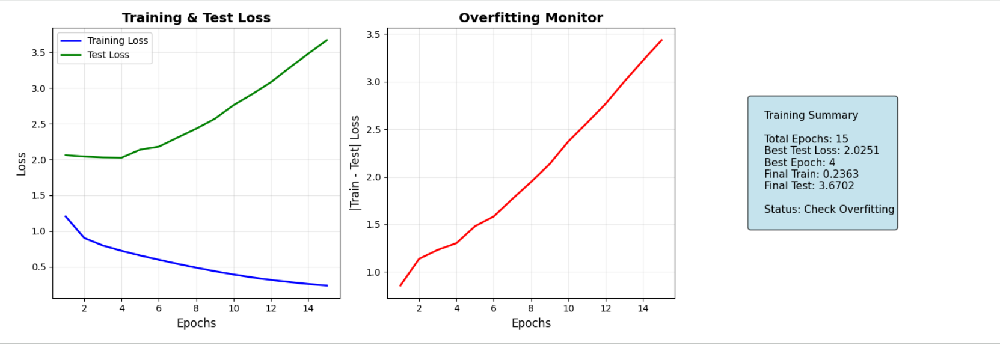

In [49]:
def plot_training_results(train_losses, test_losses):
    """Plotting train vs test results"""

    plt.figure(figsize=(15, 5))

    # Subplot 1: Loss curves (your current plot, enhanced)
    plt.subplot(1, 3, 1)
    epochs = range(1, len(train_losses) + 1)
    plt.plot(epochs, train_losses, 'b-', label='Training Loss', linewidth=2)
    plt.plot(epochs, test_losses, 'g-', label='Test Loss', linewidth=2)
    plt.xlabel('Epochs', fontsize=12)
    plt.ylabel('Loss', fontsize=12)
    plt.title('Training & Test Loss', fontsize=14, fontweight='bold')
    plt.legend()
    plt.grid(True, alpha=0.3)

    # Subplot 2: Overfitting check
    plt.subplot(1, 3, 2)
    loss_diff = [abs(t - v) for t, v in zip(train_losses, test_losses)]
    plt.plot(epochs, loss_diff, 'r-', linewidth=2)
    plt.xlabel('Epochs', fontsize=12)
    plt.ylabel('|Train - Test| Loss', fontsize=12)
    plt.title('Overfitting Monitor', fontsize=14, fontweight='bold')
    plt.grid(True, alpha=0.3)

    # Subplot 3: Summary stats
    plt.subplot(1, 3, 3)
    plt.axis('off')

    best_epoch = epochs[test_losses.index(min(test_losses))]
    summary_text = f"""
    Training Summary

    Total Epochs: {len(train_losses)}
    Best Test Loss: {min(test_losses):.4f}
    Best Epoch: {best_epoch}
    Final Train: {train_losses[-1]:.4f}
    Final Test: {test_losses[-1]:.4f}

    Status: {'Good' if abs(train_losses[-1] - test_losses[-1]) < 0.2 else 'Check Overfitting'}
    """

    plt.text(0.1, 0.5, summary_text, fontsize=11, verticalalignment='center',
             bbox=dict(boxstyle="round,pad=0.3", facecolor="lightblue", alpha=0.7))

    plt.tight_layout()
    plt.show()

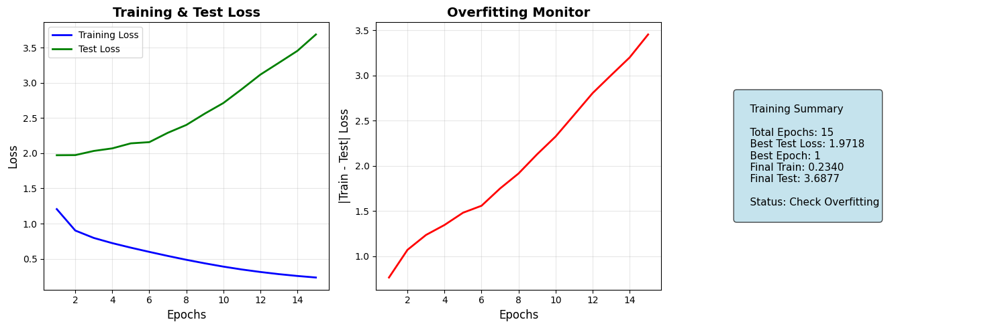

In [50]:
plot_training_results(loss_plot, test_loss_plot)

In [ ]:
# def plot_training_with_early_stopping(loss_plot, test_loss_plot, best_epoch, stopped_early):
#     """Plot training results with early stopping indicators"""

#     plt.figure(figsize=(12, 8))

#     epochs = range(1, len(loss_plot) + 1)

#     # Main plot
#     plt.subplot(2, 1, 1)
#     plt.plot(epochs, loss_plot, 'b-o', label='Training Loss', linewidth=2)
#     plt.plot(epochs, test_loss_plot, 'r-o', label='Test Loss', linewidth=2)

#     # Mark best epoch
#     plt.axvline(x=best_epoch, color='green', linestyle='--', alpha=0.7, label=f'Best Model (Epoch {best_epoch})')

#     # Mark early stopping point if applicable
#     if stopped_early:
#         plt.axvline(x=len(epochs), color='orange', linestyle='--', alpha=0.7, label='Early Stopping')

#     plt.xlabel('Epoch')
#     plt.ylabel('Loss')
#     plt.title('Training Progress with Early Stopping')
#     plt.legend()
#     plt.grid(True, alpha=0.3)

#     # Summary stats
#     plt.subplot(2, 1, 2)
#     plt.axis('off')

#     summary_text = f"""
#     Training Summary:

#     Best Epoch: {best_epoch}
#     Best Test Loss: {min(test_loss_plot):.4f}
#     Final Train Loss: {loss_plot[-1]:.4f}
#     Final Test Loss: {test_loss_plot[-1]:.4f}

#     Early Stopping: {'Yes' if stopped_early else 'No'}
#     Total Epochs: {len(loss_plot)}

#     Status: {'Prevented Overfitting' if stopped_early else 'Completed All Epochs'}
#     """

#     plt.text(0.1, 0.5, summary_text, fontsize=12, verticalalignment='center',
#              bbox=dict(boxstyle="round,pad=0.5", facecolor="lightblue", alpha=0.8))

#     plt.tight_layout()
#     plt.show()


 Epoch 1/15
  Batch 0: Loss 40.3602
  Batch 100: Loss 37.5855
  Batch 200: Loss 37.7746
  Batch 300: Loss 33.2256
  Batch 400: Loss 38.8965
Test loss improved by inf
Model saved at epoch 1
Epoch 1 Summary:
 Train Loss: 0.8952
 Test Loss: 2.0294
 Time: 141.7s
 Best Test Loss: 2.0294 (Epoch 1)

 Epoch 2/15
  Batch 0: Loss 33.4700
  Batch 100: Loss 36.3323
  Batch 200: Loss 30.9458
  Batch 300: Loss 30.5240
  Batch 400: Loss 29.8619
Test loss improved by 0.0251
Model saved at epoch 2
Epoch 2 Summary:
 Train Loss: 0.7907
 Test Loss: 2.0043
 Time: 139.9s
 Best Test Loss: 2.0043 (Epoch 2)

 Epoch 3/15
  Batch 0: Loss 27.6663
  Batch 100: Loss 31.2423
  Batch 200: Loss 28.3472
  Batch 300: Loss 29.3236
  Batch 400: Loss 26.9088
No improvement (worse by 0.0768)
Patience: 1/3
Epoch 3 Summary:
 Train Loss: 0.7171
 Test Loss: 2.0812
 Time: 159.7s
 Best Test Loss: 2.0043 (Epoch 2)

 Epoch 4/15
  Batch 0: Loss 30.3017
  Batch 100: Loss 27.6610
  Batch 200: Loss 25.8342
  Batch 300: Loss 27.8683
  

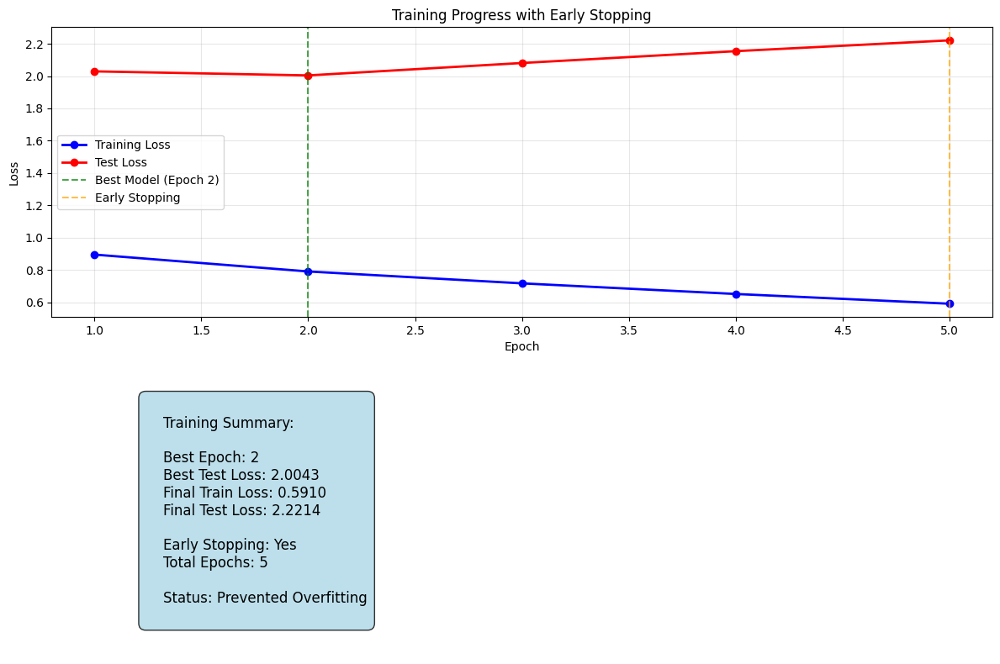

In [ ]:
# def train_with_early_stopping():
#     """Training loop with early stopping to prevent overfitting"""
#     # Early stopping parameters
#     best_test_loss = float('inf') # keeps track of the lowest test loss achieved so far during training
#     patience = 3  # Wait 3 epochs for improvement->number of epochs the training process will wait for the test loss to improve before stopping
#     patience_counter = 0 # counter keeps track of the number of epochs since the last improvement in test loss
#     best_epoch = 0 #  stores the epoch number where the best_test_loss was achieved

#     for epoch in range(EPOCHS):
#         epoch_start = time.time()
#         total_loss = 0

#         print(f"\n Epoch {epoch+1}/{EPOCHS}")

#         # Training phase
#         for (batch, (img_tensor, target)) in enumerate(train_dataset):
#             batch_loss, t_loss = train_step(img_tensor, target)
#             total_loss += t_loss

#             # Progress updates
#             if batch % 100 == 0:
#                 print(f'  Batch {batch}: Loss {batch_loss:.4f}')

#         # Calculate metrics
#         avg_train_loss = total_loss / train_num_steps
#         test_loss = test_loss_cal(test_dataset)

#         # Store for plotting
#         loss_plot.append(avg_train_loss)
#         test_loss_plot.append(test_loss)

#         # Early stopping logic
#         if test_loss < best_test_loss:
#             # Improvement
#             improvement = best_test_loss - test_loss
#             best_test_loss = test_loss
#             best_epoch = epoch + 1
#             patience_counter = 0

#             #Save the best model
#             ckpt_manager.save()

#             print(f'Test loss improved by {improvement:.4f}')
#             print(f'Model saved at epoch {epoch+1}')

#         else:
#             # No improvement
#             patience_counter += 1
#             deterioration = test_loss - best_test_loss

#             print(f'No improvement (worse by {deterioration:.4f})')
#             print(f'Patience: {patience_counter}/{patience}')

#         # Display epoch results
#         epoch_time = time.time() - epoch_start
#         print(f'Epoch {epoch+1} Summary:')
#         print(f' Train Loss: {avg_train_loss:.4f}')
#         print(f' Test Loss: {test_loss:.4f}')
#         print(f' Time: {epoch_time:.1f}s')
#         print(f' Best Test Loss: {best_test_loss:.4f} (Epoch {best_epoch})')

#         # Check if we should stop
#         if patience_counter >= patience:
#             print(f'\n EARLY STOPPING TRIGGERED!')
#             print(f'  No improvement for {patience} consecutive epochs')
#             print(f'  Best model was at epoch {best_epoch}')
#             print(f'  Best test loss: {best_test_loss:.4f}')
#             break

#     else:
#         # Training completed all epochs
#         print(f'\n Training completed all {EPOCHS} epochs')
#         print(f' Best model was at epoch {best_epoch} with test loss {best_test_loss:.4f}')

#     # Load the best model
#     print(f'\n Loading best model from epoch {best_epoch}...')
#     ckpt.restore(ckpt_manager.latest_checkpoint)

#     # Plot results
#     plot_training_with_early_stopping(loss_plot, test_loss_plot, best_epoch, patience_counter >= patience)

#     return {
#         'loss_plot': loss_plot,
#         'test_loss_plot': test_loss_plot,
#         'best_epoch': best_epoch,
#         'best_test_loss': best_test_loss,
#         'stopped_early': patience_counter >= patience
#     }

# # Run training with early stopping
# training_results = train_with_early_stopping()

**Early Stopping Training Data**

Epoch 1/15
  Batch 0: Loss 40.3602
  Batch 100: Loss 37.5855
  Batch 200: Loss 37.7746
  Batch 300: Loss 33.2256
  Batch 400: Loss 38.8965
Test loss improved by inf
Model saved at epoch 1
Epoch 1 Summary:
 Train Loss: 0.8952
 Test Loss: 2.0294
 Time: 141.7s
 Best Test Loss: 2.0294 (Epoch 1)

 Epoch 2/15
  Batch 0: Loss 33.4700
  Batch 100: Loss 36.3323
  Batch 200: Loss 30.9458
  Batch 300: Loss 30.5240
  Batch 400: Loss 29.8619
Test loss improved by 0.0251
Model saved at epoch 2
Epoch 2 Summary:
 Train Loss: 0.7907
 Test Loss: 2.0043
 Time: 139.9s
 Best Test Loss: 2.0043 (Epoch 2)

 Epoch 3/15
  Batch 0: Loss 27.6663
  Batch 100: Loss 31.2423
  Batch 200: Loss 28.3472
  Batch 300: Loss 29.3236
  Batch 400: Loss 26.9088
No improvement (worse by 0.0768)
Patience: 1/3
Epoch 3 Summary:
 Train Loss: 0.7171
 Test Loss: 2.0812
 Time: 159.7s
 Best Test Loss: 2.0043 (Epoch 2)

 Epoch 4/15
  Batch 0: Loss 30.3017
  Batch 100: Loss 27.6610
  Batch 200: Loss 25.8342
  Batch 300: Loss 27.8683
  Batch 400: Loss 23.4938
No improvement (worse by 0.1502)
Patience: 2/3
Epoch 4 Summary:
 Train Loss: 0.6513
 Test Loss: 2.1545
 Time: 133.0s
 Best Test Loss: 2.0043 (Epoch 2)

 Epoch 5/15
  Batch 0: Loss 24.6260
  Batch 100: Loss 24.4204
  Batch 200: Loss 23.2032
  Batch 300: Loss 23.4474
  Batch 400: Loss 21.5808
No improvement (worse by 0.2171)
Patience: 3/3
Epoch 5 Summary:
 Train Loss: 0.5910
 Test Loss: 2.2214
 Time: 133.1s
 Best Test Loss: 2.0043 (Epoch 2)

 EARLY STOPPING TRIGGERED!
  No improvement for 3 consecutive epochs
  Best model was at epoch 2
  Best test loss: 2.0043

**Loss curve**:-
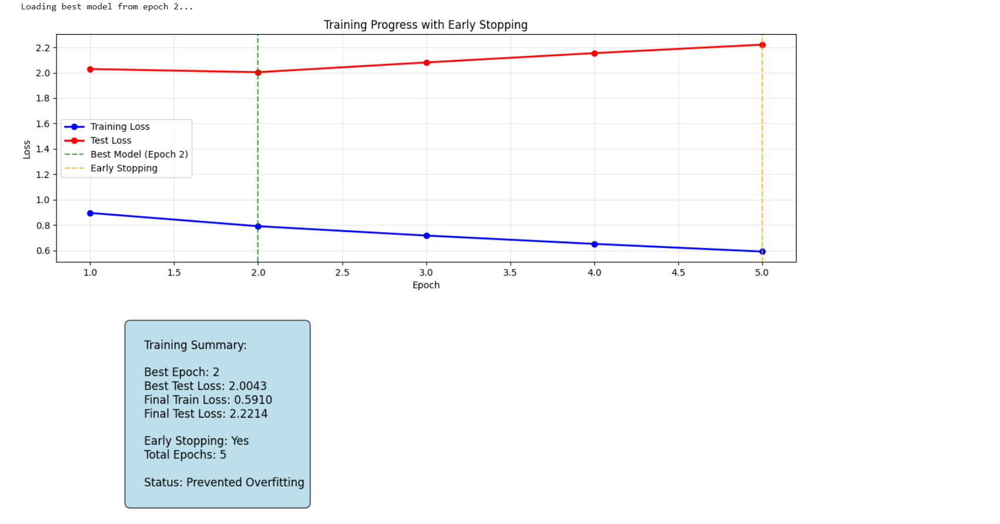

## <font color = red> **Model Evaluation**
1.Define your evaluation function using greedy search

2.Define your evaluation function using beam search ( optional)

3.Test it on a sample data using BLEU score

### <font color = red> **Greedy Search**

In [51]:
# features_shape = 2048
attention_features_shape = 64

#Evaluation with Greedy search
def evaluate(image):
    # Return types and usage
    # result
    # Example: ['a', 'dog', 'running', 'in', 'park']
    # Usage: Final caption display, text-to-speech

    # attention_plot
    # Full attention array (max_length, 64)
    # Usage: Attention visualization, model interpretability

    # predictions (Raw Logits)
    # Shape: (vocab_size,) - probability distribution over all words
    # Usage: Confidence analysis, alternative word suggestions, debugging

    attention_plot = np.zeros((max_length, attention_features_shape))

    hidden = decoder.init_state(batch_size=1)

    temp_input = tf.expand_dims(load_image(image)[0], 0) #process the input image to desired format before extracting features
    img_tensor_val = base_model(temp_input) # Extract features using our feature extraction model
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))

    features = encoder(img_tensor_val) # extract the features by passing the input to encoder

    dec_input = tf.expand_dims([tokenizer.word_index['<start>']], 0)
    result = []

    for i in range(max_length):
        predictions, hidden, attention_weights = decoder(dec_input, features, hidden) # get the output from decoder

        attention_plot[i] = tf.reshape(attention_weights, (-1, )).numpy()

        #Greedy search
        predicted_id = tf.argmax(predictions[0]).numpy() #extract the predicted id(embedded value) which carries the max value
        result.append(tokenizer.index_word[predicted_id]) #map the id to the word from tokenizer and append the value to the result list

        if tokenizer.index_word[predicted_id] == '<end>':
            return result, attention_plot,predictions

        dec_input = tf.expand_dims([predicted_id], 0)

    attention_plot = attention_plot[:len(result), :]
    return result, attention_plot,predictions



In [52]:
def image_attention_map(caption, attention_weights, image_path):
    """
    Plot image and attention maps

    Args:
        caption: List of words in the caption
        attention_weights: Attention weights array (attention_plot)
        image_path: Path to image file
    """
    print(f"\nProcessing: {os.path.basename(image_path)}")

    try:
        # Check if image exists
        if not os.path.exists(image_path):
            print(f"Image not found: {image_path}")
            return False

        # Create figure
        plt.figure(figsize=(15, 6))

        # Show original image
        plt.subplot(1, 2, 1)
        img = Image.open(image_path)
        plt.imshow(img)
        plt.title(f"Input Image\n{os.path.basename(image_path)}", fontsize=12, fontweight='bold')
        plt.axis('off')

        # Show attention map
        plt.subplot(1, 2, 2)

        if attention_weights is not None and attention_weights.size > 0:
            # Average attention across all words and reshape to 8x8 grid
            attention_map = attention_weights.mean(axis=0).reshape(8, 8)

            im = plt.imshow(attention_map, cmap='hot', interpolation='bilinear')
            plt.title("Attention Map", fontsize=12, fontweight='bold')

            # Add colorbar with proper scaling
            cbar = plt.colorbar(im, fraction=0.046, pad=0.04)
            cbar.set_label('Attention Intensity', rotation=270, labelpad=15)
        else:
            plt.text(0.5, 0.5, "No attention data available",
                    ha='center', va='center', fontsize=14,
                    bbox=dict(boxstyle="round,pad=0.5", facecolor="lightgray", alpha=0.8))
            plt.title("Attention Map", fontsize=12, fontweight='bold')

        plt.axis('off')
        plt.tight_layout()
        plt.show()

        return True

    except Exception as e:
        print(f"Exception while creating image and attention maps: {e}")
        return False

In [53]:
def plot_attention_for_each_word(result, attention_plot, image_path):
    """
    Attention visualization with word-by-word breakdown

    Args:
        result: List of caption words
        attention_plot: Attention weights array (max_length, 64)
        image_path: Path to image file
    """
    print(f"Creating attention for each word")

    try:
        # Load image
        img = np.array(Image.open(image_path))

        # Clean caption (remove special tokens)
        clean_caption = [word for word in result if word not in ['<start>', '<end>', '<unk>', '<pad>']]

        if len(clean_caption) == 0:
            print("No valid words in caption")
            return False

        # Create figure with subplots
        num_words = len(clean_caption)
        cols = min(4, num_words)  # Max 4 columns
        rows = (num_words + cols - 1) // cols  # Calculate rows needed

        plt.figure(figsize=(4*cols, 4*rows + 2))

        # Plot each word's attention
        for i, word in enumerate(clean_caption):
            if i < len(attention_plot):
                plt.subplot(rows, cols, i + 1)

                # Reshape attention to 8x8 grid
                attention_weights = attention_plot[i].reshape(8, 8)

                # Resize attention to match image size for overlay
                attention_resized = np.array(Image.fromarray(attention_weights).resize((224, 224), Image.LANCZOS))

                # Show image
                plt.imshow(img)

                # Overlay attention
                plt.imshow(attention_resized, cmap='jet', alpha=0.6,
                          extent=[0, img.shape[1], img.shape[0], 0])

                plt.title(f"'{word}'", fontsize=12, fontweight='bold')
                plt.axis('off')

        plt.suptitle(f"Word-by-Word Attention: {' '.join(clean_caption)}",
                     fontsize=14, fontweight='bold')
        plt.tight_layout()
        plt.show()

        return True

    except Exception as e:
        print(f"Exception while creating image and attention maps: {e}")
        return False

In [54]:
def filt_text(text):
    """Remove special tokens from generated text"""
    if not text:
        return ""

    # Special tokens to remove
    special_tokens = ['<start>', '<unk>', '<end>', '<pad>']

    # Handle both string and list input
    if isinstance(text, list):
        words = text
    else:
        words = text.split()

    # Filter out special tokens
    filtered_words = [word for word in words if word not in special_tokens]

    # Join back to string
    clean_text = ' '.join(filtered_words)
    return clean_text.strip()

# Usage examples:
# filt_text("<start> a dog running in park <end>")  returns=> "a dog running in park"
# filt_text(["<start>", "cat", "sleeping", "<end>"])  return=> "cat sleeping"

## <font color = red> **Prediction**

In [55]:
image_test = path_test.copy()

In [56]:
def predict_caption_audio(random, autoplay=False, weights=(0.5, 0.5, 0, 0)) :

    cap_test_data = cap_test.copy()
    rid = np.random.randint(0, random)
    test_image = image_test[rid]
    #test_image = './images/413231421_43833a11f5.jpg'
    #real_caption = '<start> black dog is digging in the snow <end>'

    real_caption = ' '.join([tokenizer.index_word[i] for i in cap_test_data[rid] if i not in [0]])
    result, attention_plot, pred_test = evaluate(test_image)
    real_caption=filt_text(real_caption)
    pred_caption=' '.join(result).rsplit(' ', 1)[0]
    real_appn = []
    real_appn.append(real_caption.split())
    reference = real_appn
    candidate = pred_caption.split()

    score = sentence_bleu(reference, candidate, weights=weights)#set your weights
    print(f"BELU score: {score*100}")
    print ('Real Caption:', real_caption)
    print ('Prediction Caption:', pred_caption)


    # we will make use of Google Text to Speech API (online), which will convert the caption to audio
    filename = f"voice_{int(time.time())}.mp3"
    filepath = os.path.join(audio_output_path, filename)
    os.makedirs(audio_output_path, exist_ok=True)
    speech = gTTS('Predicted Caption : ' + pred_caption, lang = 'en', slow = False)
    # save on directory
    speech.save(filepath)
    # save for local playback
    speech.save('voice.mp3')
    audio_file = 'voice.mp3'

    display(Audio(audio_file, rate = None, autoplay = autoplay))
    # plot_attention_map(result, attention_plot, test_image)
    image_attention_map(result, attention_plot, test_image)

    plot_attention_for_each_word(result, attention_plot, test_image)
    return test_image

**BLEU Score Weights** - Variation and Significance of Weights

The weights control how BLEU score emphasizes different n-gram matches between real and predicted captions.
- **BLEU-1**: Measures unigram precision
- **BLEU-2**: Measures bigram precision  
- **BLEU-3**: Measures trigram precision
- **BLEU-4**: Measures 4-gram precision

**Implementation**:-

(weight for 1-grams (individual words), weight for 2-grams (phrases f 2 words), weight for 3-grams (phrases of 3 words), weight for 4-grams (phrases of 4 words))


1. Word-Focused (Your Current):
weights = (0.35, 0.25, 0, 0)
- Emphasis on individual words
- Good for: Checking if key concepts are captured
- Example: "dog", "running", "field" present
2. Balanced Approach:
weights = (0.25, 0.25, 0.25, 0.25)  
- Equal emphasis
- Good for: Overall caption quality assessment
- Example: Considers both words and phrase structure
3. Phrase-Focused:
weights = (0.1, 0.3, 0.4, 0.2)
- Emphasis on longer phrases
- Good for: Checking grammatical structure
- Example: "black dog", "is running", "in the field"
4. Strict Matching:
weights = (0.1, 0.2, 0.3, 0.4)
- Heavy emphasis on 4-grams
- Good for: Very precise caption matching
- Example: Requires exact phrase matches

**Test**

BELU score: 18.91798010071109
Real Caption: a dog running through the grass with a stick in his mouth
Prediction Caption: a black and white dog is running through the grass



Processing: 468911753_cc595f5da0.jpg


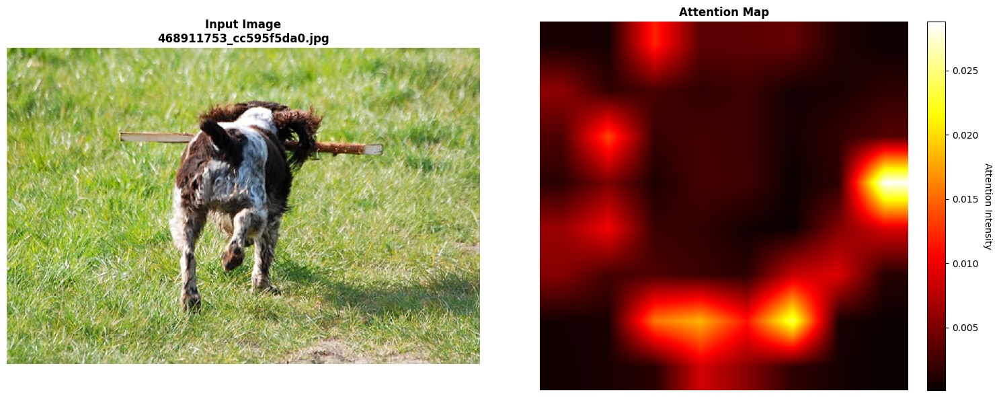

Creating attention for each word


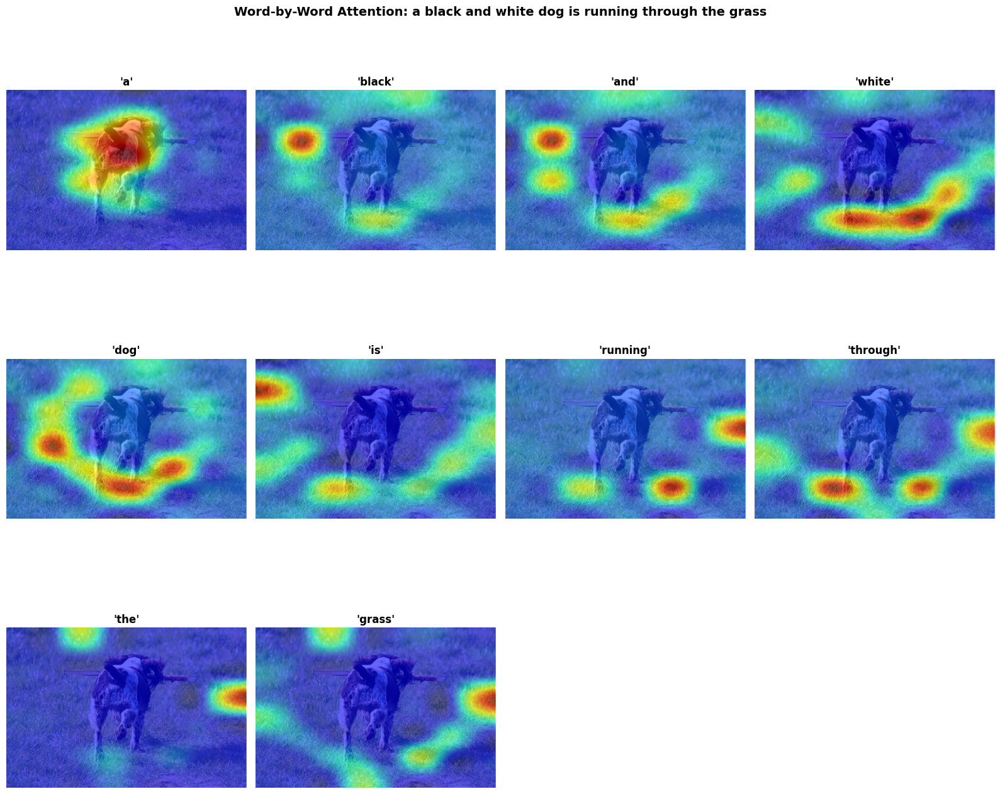

In [57]:
test_image = predict_caption_audio(len(image_test), True, weights = (0.1, 0.2, 0.3, 0.4))

BELU score: 1.0244914152188952e-229
Real Caption: two dogs playing in the snow
Prediction Caption: a large black and white dog in a snowy field



Processing: 2398605966_1d0c9e6a20.jpg


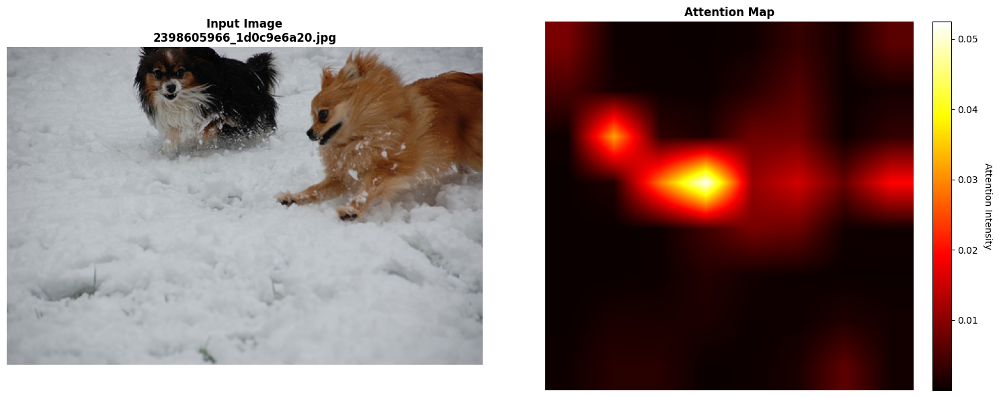

Creating attention for each word


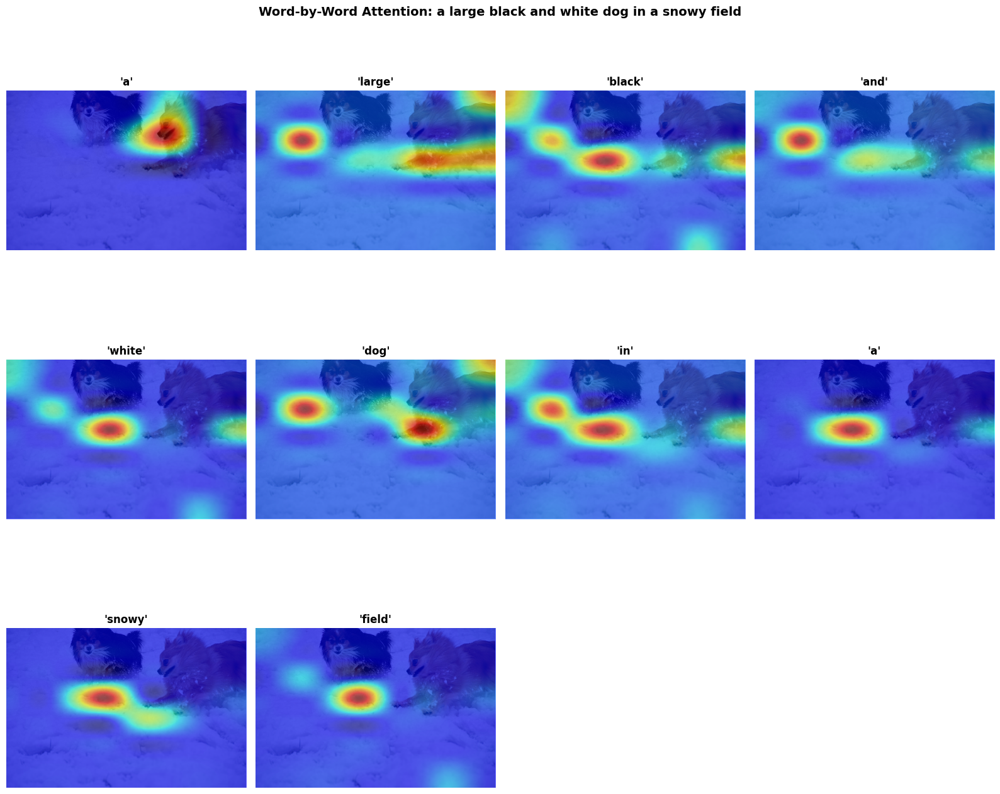

In [58]:
test_image = predict_caption_audio(len(image_test), True, weights = (0.25, 0.25, 0.25, 0.25))

BELU score: 29.130399593623736
Real Caption: person in blue coat jumping in standing water on pavement with body of water in the background
Prediction Caption: a man jumping in a mud puddle in the middle of the street



Processing: 2043427251_83b746da8e.jpg


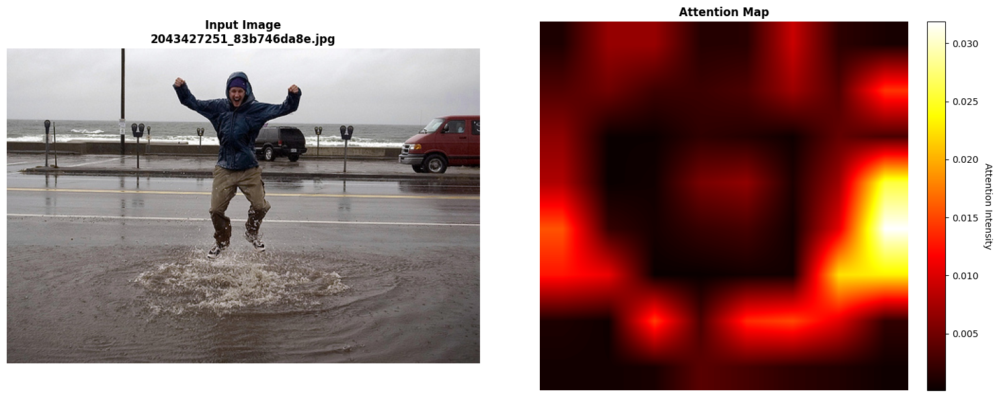

Creating attention for each word


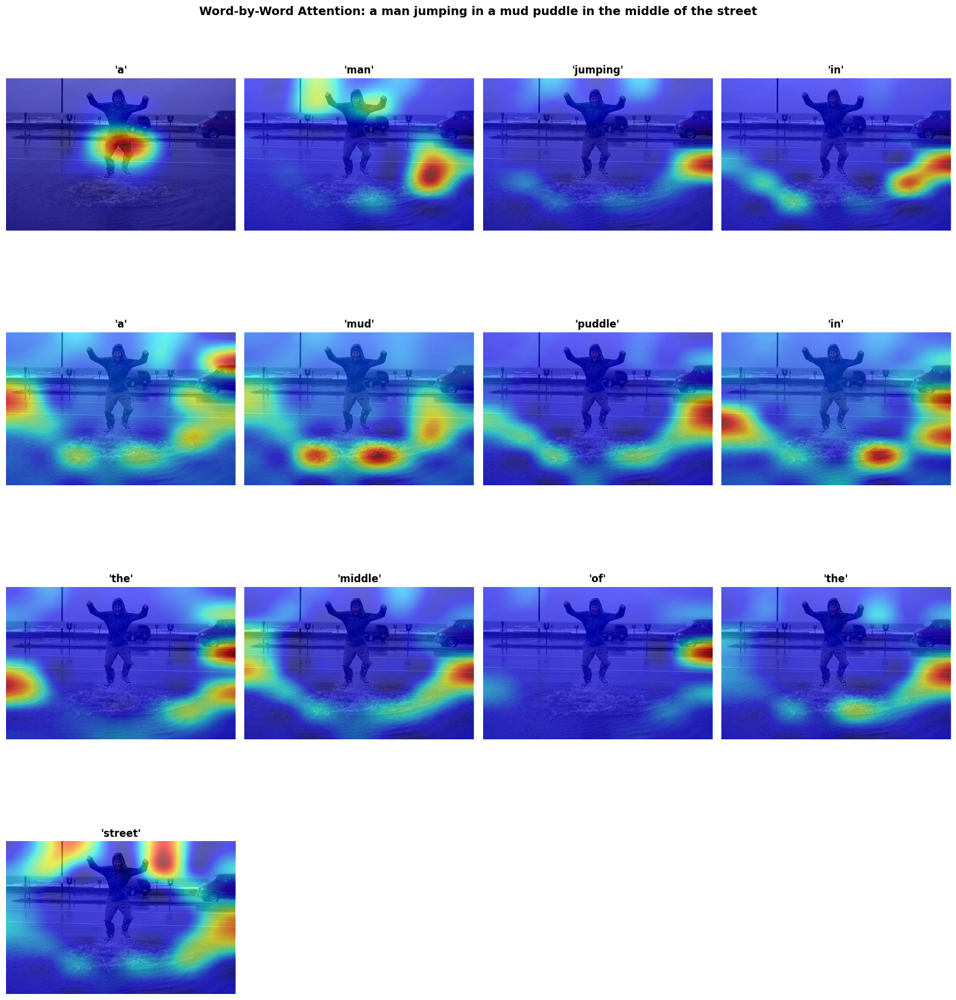

In [63]:
test_image = predict_caption_audio(len(image_test), True, weights = (0.5, 0.25, 0, 0))

BELU score: 19.893642523656357
Real Caption: a man in a checked shirt is sitting at a table looking back at a group of people behind him
Prediction Caption: a man sits at a wooden deck and a baby sits



Processing: 2445442929_8c81d42460.jpg


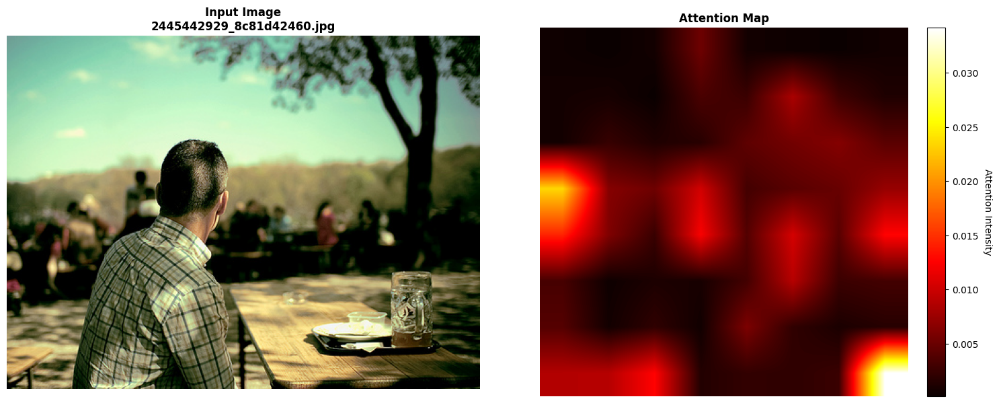

Creating attention for each word


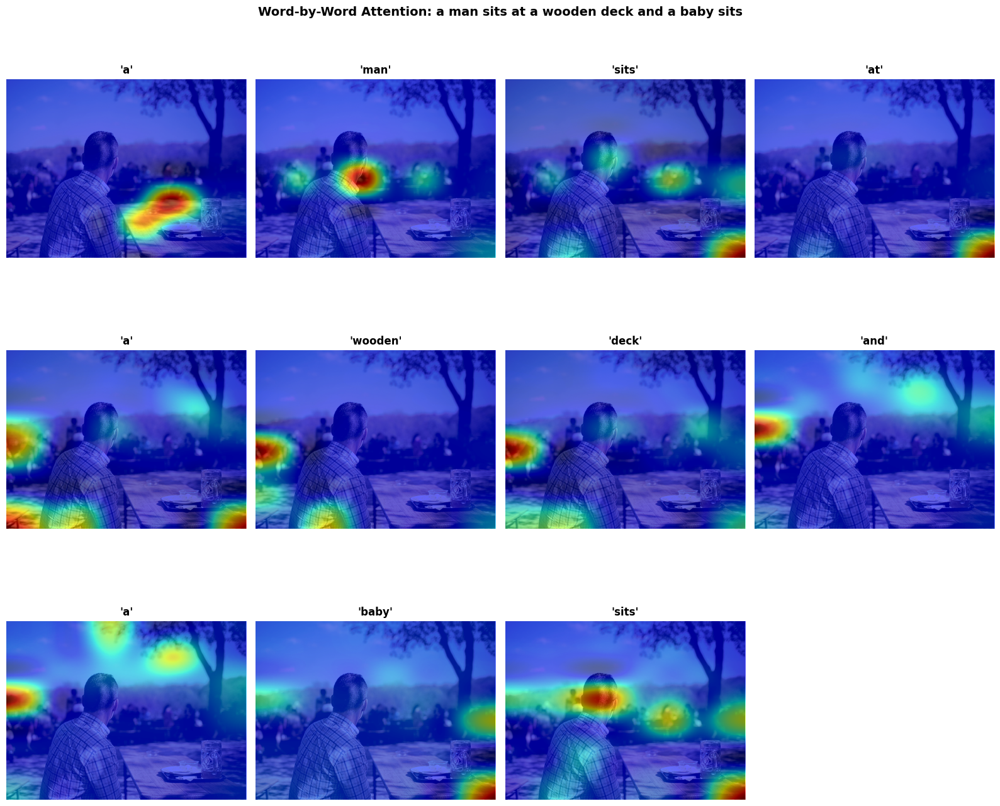

In [60]:
test_image = predict_caption_audio(len(image_test), True, weights = (0.5, 0.25, 0, 0))

BELU score: 59.84157566975099
Real Caption: a girl in a yellow shirt jumping over a hurdle
Prediction Caption: a girl in a blue swimsuit watches jumping from a pole hurdle



Processing: 3550255426_4ab03c0d6e.jpg


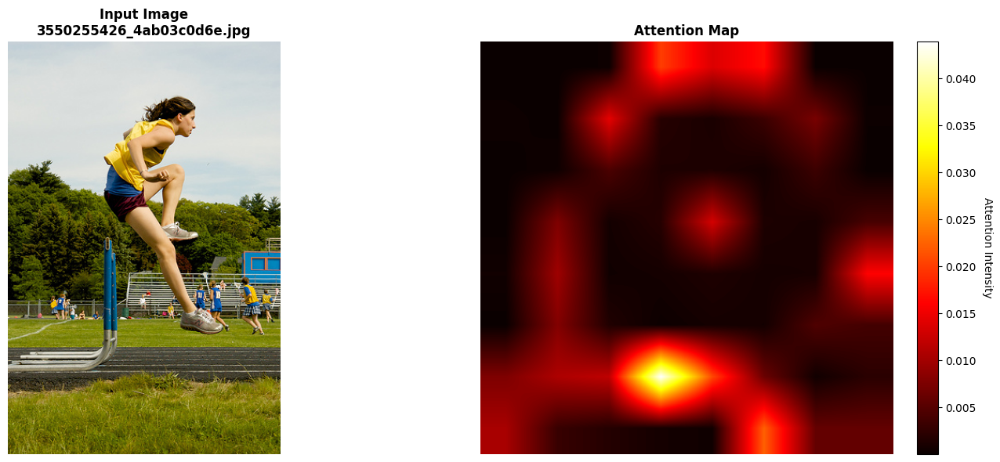

Creating attention for each word


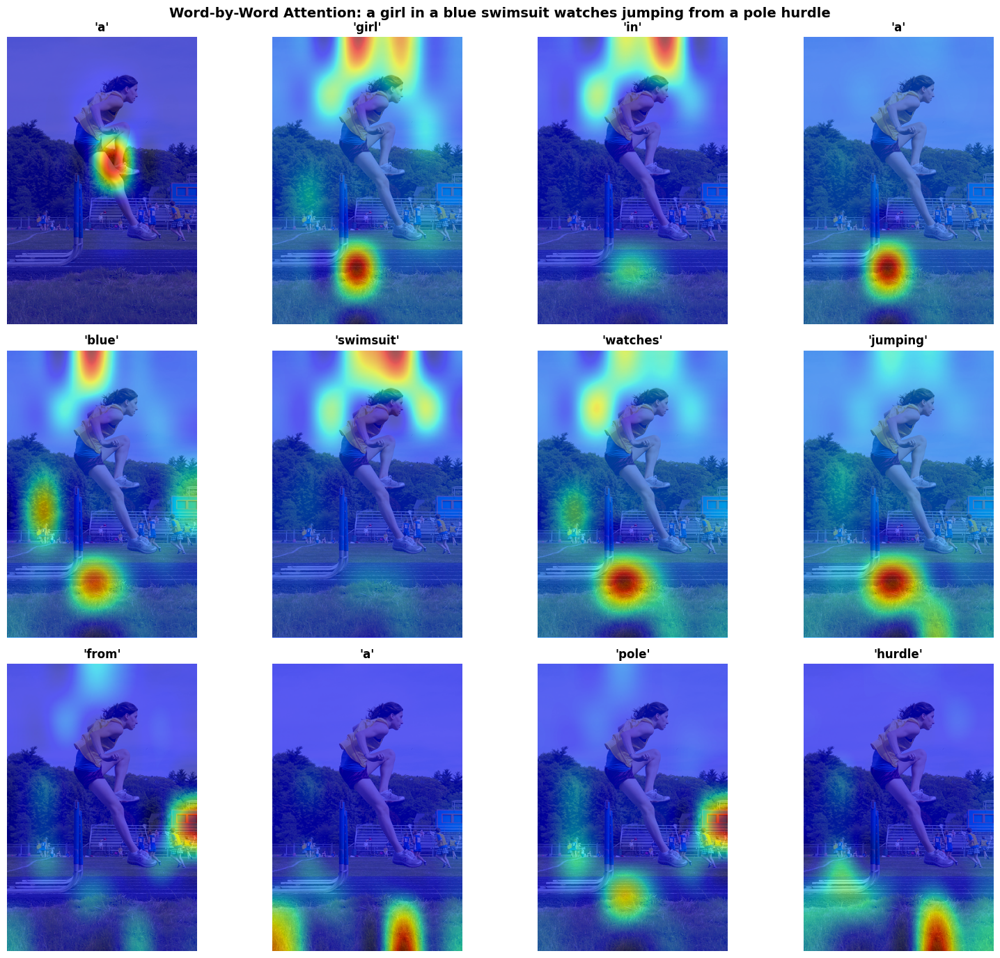

In [62]:
test_image = predict_caption_audio(len(image_test), True, weights = (0.35, 0.25, 0, 0))

### Beam Search(optional)

## <font color = red> **Results**

As per Evaluation Rubric, following objectives needs to be met for completion of project

-	Data preparation
-	Modelling Building
-	Model Evaluation
-	Code readability and conciseness
-	Prediction

**Result: All steps executed successfully and available in Jupyter notebook.**


## <font color = red> **Challenges faced**

-	Compute power for model training.
- Choosing between Training Completion for defined number of Epochs(implemented approach) vs. Early Stopping(discarded this approach)
-	Train and test loss optimization.
-	Model training and handling shape mismatches, symbolic graph errors, or gradient flow issues - with GRU Vs GRUCell(low level GRU implementation) approach.


## <font color = red> **Future Improvements**

-	GRU is used as RNN architecture and Bahdanau Attention as attention mechanism.
Model can be trained tested with LSTM RNN architecture and other attention(Dot-product attention, Luong or Multiplicative Attention) Mechanism and results can be compared for better results.
-	Beam Search is optional scope that can be covered.
- Implement Additional Metrics: Libraries that can calculate other standard image captioning evaluation metrics like METEOR, CIDEr, and SPICE. These metrics often correlate better with human judgment of caption quality than BLEU.
- Hyperparameters: More systematic approach to hyperparameter tuning.
This could involve: (1) Grid Search: Define a grid of hyperparameter values and train the model with each combination.(2) Random Search: Randomly sample hyperparameter combinations from a defined range.(3)
Libraries: Use of libraries like Keras Tuner or Optuna to automate the hyperparameter tuning process.
